# Rainfall Weather Forecasting

### Project Description

Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.
Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:
 
1. Problem Statement: 

a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.


#### Dataset Description:

Number of columns: 23


- ```Date```  - The date of observation
- ```Location```  -The common name of the location of the weather station
- ```MinTemp```  -The minimum temperature in degrees celsius
- ```MaxTemp``` -The maximum temperature in degrees celsius
- ```Rainfall ``` -The amount of rainfall recorded for the day in mm
- ```Evaporation```  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am
- ```Sunshine ``` -The number of hours of bright sunshine in the day.
- ```WindGustDi r```- The direction of the strongest wind gust in the 24 hours to midnight
- ```WindGustSpeed``` -The speed (km/h) of the strongest wind gust in the 24 hours to midnight
- ```WindDir9am``` -Direction of the wind at 9am
-``` WindDir3pm``` -Direction of the wind at 3pm
-``` WindSpeed9am ```-Wind speed (km/hr) averaged over 10 minutes prior to 9am
-``` WindSpeed3pm``` -Wind speed (km/hr) averaged over 10 minutes prior to 3pm
-``` Humidity9am``` -Humidity (percent) at 9am
-``` Humidity3pm ```-Humidity (percent) at 3pm
- ```Pressure9am ```-Atmospheric pressure (hpa) reduced to mean sea level at 9am
- ```Pressure3pm``` -Atmospheric pressure (hpa) reduced to mean sea level at 3pm
- ```Cloud9am ```- Fraction of sky obscured by cloud at 9am. 
-``` Cloud3pm ```-Fraction of sky obscured by cloud 
- ```Temp9am-```Temperature (degrees C) at 9am
-``` Temp3pm ```-Temperature (degrees C) at 3pm
-``` RainToday ```-Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0
- ```RainTomorrow ```-The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".

Dataset Link-  
•	https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv

•	https://github.com/dsrscientist/dataset3


## Import Necessary Libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import scipy as stats
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import scipy.stats as stats
from sklearn.preprocessing import LabelEncoder
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import power_transform
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score,roc_curve,plot_roc_curve
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,ConfusionMatrixDisplay
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from sklearn.metrics import classification_report
import pickle
#########################CLASSIFICATION lIBRARIES######################################
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import RidgeClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
#########################REGRESSION lIBRARIES######################################
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor


### Reading Dataset

In [2]:
#Reading Dataset From Local Machine
df = pd.read_csv("weatherAUS.csv")
pd.set_option("display.max_columns", None)
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


## EDA(Exploratory Data Analysis)

In [3]:
#checking the shape of dataset
print("There are {} rows and {} columns respectively present in the dataset.".format(*df.shape))

There are 8425 rows and 23 columns respectively present in the dataset.


In [4]:
# checking duplicate values in the dataset
print("There are {} duplicates present in the dataset".format(df.duplicated().sum()))

There are 1663 duplicates present in the dataset


In [5]:
# Dropping Duplicate values
df.drop_duplicates(inplace=True)

In [6]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


**Here I am Seeing how many types of features are present in my dataset**

In [7]:
# Saperating Numerical Discreate Contineous  And Categorical columns
numerical_feature = [feature for feature in df.columns if df[feature].dtypes != 'O']
discrete_feature=[feature for feature in numerical_feature if len(df[feature].unique())<25]
continuous_feature = [feature for feature in numerical_feature if feature not in discrete_feature]
categorical_feature = [feature for feature in df.columns if feature not in numerical_feature]
print("Numerical Features Count {}".format(len(numerical_feature)))
print("Discrete feature Count {}".format(len(discrete_feature)))
print("Continuous feature Count {}".format(len(continuous_feature)))
print("Categorical feature Count {}".format(len(categorical_feature)))

Numerical Features Count 16
Discrete feature Count 2
Continuous feature Count 14
Categorical feature Count 7


In [8]:
# checking null values in the dataset
df.isnull().sum()*100/len(df)

Date              0.000000
Location          0.000000
MinTemp           1.035197
MaxTemp           0.842946
Rainfall          2.040816
Evaporation      43.197279
Sunshine         47.855664
WindGustDir      13.930790
WindGustSpeed    13.930790
WindDir9am       11.742088
WindDir3pm        4.347826
WindSpeed9am      0.931677
WindSpeed3pm      1.478852
Humidity9am       0.798580
Humidity3pm       1.419698
Pressure9am      19.343390
Pressure3pm      19.387755
Cloud9am         27.595386
Cloud3pm         28.127773
Temp9am           0.754215
Temp3pm           1.360544
RainToday         2.040816
RainTomorrow      2.040816
dtype: float64

#### Important Observations

1. **Missing Data Percentage:**
   - The dataset contains missing values in several columns, represented as a percentage of missing values relative to the total number of rows.

2. **Columns with Low Missing Values:**
   - The columns `MinTemp` and `MaxTemp` have relatively low missing values, with approximately 1.04% and 0.84% missing data, respectively.

3. **Columns with Moderate Missing Values:**
   - The columns `Rainfall`, `WindSpeed9am`, `WindSpeed3pm`, `Humidity9am`, `Humidity3pm`, `Temp9am`, `Temp3pm`, `RainToday`, and `RainTomorrow` have missing values ranging from approximately 0.75% to 2.04%.

4. **Columns with High Missing Values:**
   - The columns `Evaporation`, `Sunshine`, `WindGustDir`, `WindGustSpeed`, `WindDir9am`, `Pressure9am`, `Pressure3pm`, `Cloud9am`, and `Cloud3pm` have a significant amount of missing data, ranging from approximately 11.74% to 47.86%.

5. **Imputation Consideration:**
   - Depending on the importance of these columns and their relevance to your analysis, you may need to consider imputation strategies for columns with missing data. This could involve methods such as mean imputation, median imputation, or more sophisticated techniques like regression imputation.

6. **Data Integrity:**
   - It's important to assess the impact of missing data on the overall quality and integrity of your analysis. Consider how missing values may affect the interpretation of your results and the suitability of the dataset for your specific analysis goals.

7. **Further Data Exploration:**
   - Explore the relationships between missing data in different columns and potential patterns or dependencies. For example, missing values in `Sunshine` may be related to missing values in `Cloud9am` and `Cloud3pm`.

8. **Data Preparation:**
   - Before performing any analysis or modeling, you should decide on an appropriate strategy for handling missing data, which may include imputation, removal of rows or columns with excessive missing values, or other domain-specific approaches.

Remember to adapt these observations and actions to your specific analysis goals and domain knowledge. Dealing with missing data is a crucial step in data preprocessing to ensure the accuracy and reliability of your analysis.


### Filling Null values

In [9]:
# this function is designed to fill missing values in a specific variable of a DataFrame with randomly selected values from the same variable, ensuring that the replacement values are aligned with the missing entries.
def randomsampleimputation(df, variable):
    df[variable]=df[variable]
    random_sample=df[variable].dropna().sample(df[variable].isnull().sum(),random_state=0)
    random_sample.index=df[df[variable].isnull()].index
    df.loc[df[variable].isnull(),variable]=random_sample

In [10]:
# Filling Theses columns null values by random sample imputation
randomsampleimputation(df, "Cloud9am")
randomsampleimputation(df, "Cloud3pm")
randomsampleimputation(df, "Evaporation")
randomsampleimputation(df, "Sunshine")

In [11]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,4.2,3.8,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,8.0,9.9,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,4.0,1.0,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,2.0,5.8,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,8.0,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,2.8,10.1,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,0.0,2.0,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,1.2,9.5,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [12]:
# Filing Null values of contineous features by median technique
for feature in continuous_feature:
    if(df[feature].isnull().sum()*100/len(df))>0:
        df[feature] = df[feature].fillna(df[feature].median())

In [13]:
df.isnull().sum()*100/len(df)

Date              0.000000
Location          0.000000
MinTemp           0.000000
MaxTemp           0.000000
Rainfall          0.000000
Evaporation       0.000000
Sunshine          0.000000
WindGustDir      13.930790
WindGustSpeed     0.000000
WindDir9am       11.742088
WindDir3pm        4.347826
WindSpeed9am      0.000000
WindSpeed3pm      0.000000
Humidity9am       0.000000
Humidity3pm       0.000000
Pressure9am       0.000000
Pressure3pm       0.000000
Cloud9am          0.000000
Cloud3pm          0.000000
Temp9am           0.000000
Temp3pm           0.000000
RainToday         2.040816
RainTomorrow      2.040816
dtype: float64

In [14]:
discrete_feature

['Cloud9am', 'Cloud3pm']

In [15]:
# Filling null values of discreate features by mode technique
def mode_nan(df,variable):
    mode=df[variable].value_counts().index[0]
    df[variable].fillna(mode,inplace=True)
mode_nan(df,"Cloud9am")
mode_nan(df,"Cloud3pm")

In [16]:
# Filling null values of categorical columns  by pandas getdummies technique
df["RainToday"] = pd.get_dummies(df["RainToday"], drop_first = True)
df["RainTomorrow"] = pd.get_dummies(df["RainTomorrow"], drop_first = True)
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,4.2,3.8,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,0,0
1,2008-12-02,Albury,7.4,25.1,0.0,8.0,9.9,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,4.0,1.0,17.2,24.3,0,0
2,2008-12-03,Albury,12.9,25.7,0.0,2.0,5.8,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,8.0,2.0,21.0,23.2,0,0
3,2008-12-04,Albury,9.2,28.0,0.0,2.8,10.1,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,0.0,2.0,18.1,26.5,0,0
4,2008-12-05,Albury,17.5,32.3,1.0,1.2,9.5,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,7.6,9.9,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,7.0,4.0,10.1,22.4,0,0
8421,2017-06-22,Uluru,3.6,25.3,0.0,9.4,12.1,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,1.0,5.0,10.9,24.5,0,0
8422,2017-06-23,Uluru,5.4,26.9,0.0,2.4,6.7,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,8.0,6.0,12.5,26.1,0,0
8423,2017-06-24,Uluru,7.8,27.0,0.0,4.0,0.0,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,0,0


In [17]:
for feature in categorical_feature:
    print(feature, (df.groupby([feature])["RainTomorrow"].mean().sort_values(ascending = False)).index)

Date Index(['2016-04-30', '2017-03-04', '2015-11-03', '2017-02-27', '2017-02-28',
       '2017-03-01', '2017-03-02', '2017-03-03', '2013-04-12', '2015-04-29',
       ...
       '2013-01-11', '2013-01-10', '2013-01-09', '2013-01-08', '2013-01-07',
       '2013-01-05', '2013-01-04', '2013-01-03', '2013-01-02', '2017-06-25'],
      dtype='object', name='Date', length=3004)
Location Index(['CoffsHarbour', 'Wollongong', 'Melbourne', 'Williamtown', 'Newcastle',
       'Penrith', 'Brisbane', 'Adelaide', 'Albury', 'PerthAirport', 'Darwin',
       'Uluru'],
      dtype='object', name='Location')
WindGustDir Index(['NW', 'NNW', 'N', 'WNW', 'SSW', 'S', 'WSW', 'SW', 'SSE', 'NNE', 'NE',
       'SE', 'ESE', 'W', 'ENE', 'E'],
      dtype='object', name='WindGustDir')
WindDir9am Index(['N', 'WNW', 'SW', 'NNE', 'NNW', 'W', 'SSW', 'WSW', 'ESE', 'NW', 'NE',
       'S', 'SSE', 'SE', 'ENE', 'E'],
      dtype='object', name='WindDir9am')
WindDir3pm Index(['NNW', 'SSW', 'N', 'NW', 'S', 'WNW', 'SE', 'NNE', 'E

```
This code iterates through each categorical feature in the categorical_feature list and prints the feature name along with the sorted indices of the unique values in that feature based on the mean of the "RainTomorrow" column in descending order.
```

In [18]:
windgustdir = {'NNW':0, 'NW':1, 'WNW':2, 'N':3, 'W':4, 'WSW':5, 'NNE':6, 'S':7, 'SSW':8, 'SW':9, 'SSE':10,
       'NE':11, 'SE':12, 'ESE':13, 'ENE':14, 'E':15}
winddir9am = {'NNW':0, 'N':1, 'NW':2, 'NNE':3, 'WNW':4, 'W':5, 'WSW':6, 'SW':7, 'SSW':8, 'NE':9, 'S':10,
       'SSE':11, 'ENE':12, 'SE':13, 'ESE':14, 'E':15}
winddir3pm = {'NW':0, 'NNW':1, 'N':2, 'WNW':3, 'W':4, 'NNE':5, 'WSW':6, 'SSW':7, 'S':8, 'SW':9, 'SE':10,
       'NE':11, 'SSE':12, 'ENE':13, 'E':14, 'ESE':15}
df["WindGustDir"] = df["WindGustDir"].map(windgustdir)
df["WindDir9am"] = df["WindDir9am"].map(winddir9am)
df["WindDir3pm"] = df["WindDir3pm"].map(winddir3pm)

```
This code converts categorical wind direction values in three columns ("WindGustDir," "WindDir9am," and "WindDir3pm") of the DataFrame df into numerical values using predefined dictionaries.
```

In [19]:
df["WindGustDir"] = df["WindGustDir"].fillna(df["WindGustDir"].value_counts().index[0])
df["WindDir9am"] = df["WindDir9am"].fillna(df["WindDir9am"].value_counts().index[0])
df["WindDir3pm"] = df["WindDir3pm"].fillna(df["WindDir3pm"].value_counts().index[0])

```
This code fills missing values in the "WindGustDir," "WindDir9am," and "WindDir3pm" columns of the DataFrame df with the most frequent (mode) value in each respective column
```

In [20]:
df.isnull().sum()*100/len(df)

Date             0.0
Location         0.0
MinTemp          0.0
MaxTemp          0.0
Rainfall         0.0
Evaporation      0.0
Sunshine         0.0
WindGustDir      0.0
WindGustSpeed    0.0
WindDir9am       0.0
WindDir3pm       0.0
WindSpeed9am     0.0
WindSpeed3pm     0.0
Humidity9am      0.0
Humidity3pm      0.0
Pressure9am      0.0
Pressure3pm      0.0
Cloud9am         0.0
Cloud3pm         0.0
Temp9am          0.0
Temp3pm          0.0
RainToday        0.0
RainTomorrow     0.0
dtype: float64

Now i have filled all the null values

#### Checking Correlation

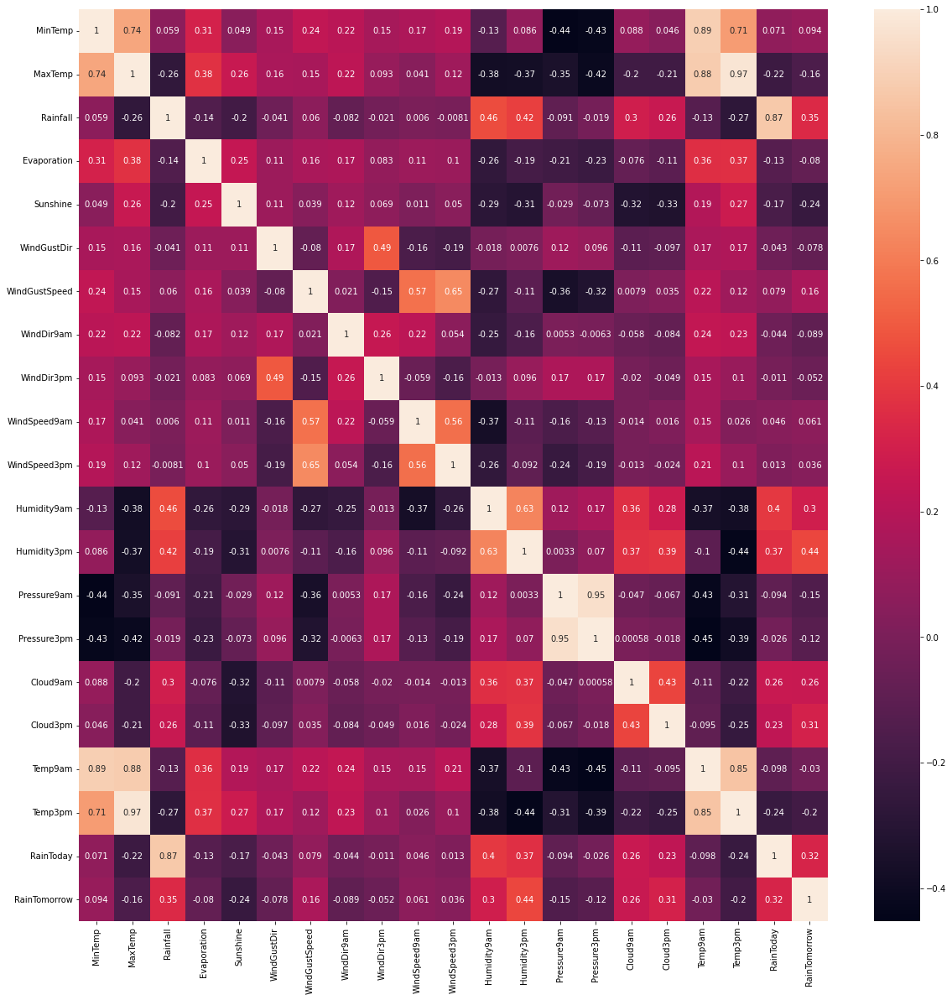

In [21]:
corrmat = df.corr(method = "spearman")
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(corrmat,annot=True)

```
Observation:

Here some of the columns have very high correlation with each other
```

#### Checking Distribution of contineous_features

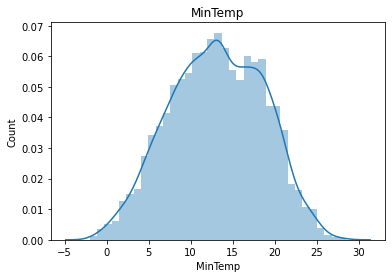

<Figure size 1080x1080 with 0 Axes>

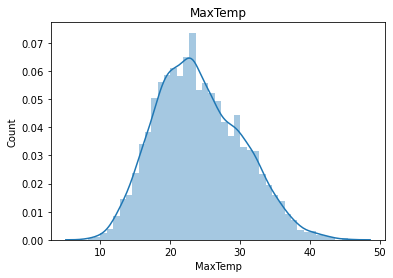

<Figure size 1080x1080 with 0 Axes>

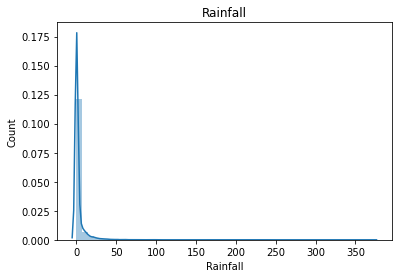

<Figure size 1080x1080 with 0 Axes>

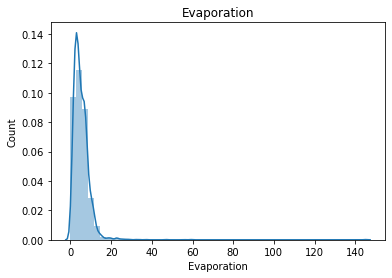

<Figure size 1080x1080 with 0 Axes>

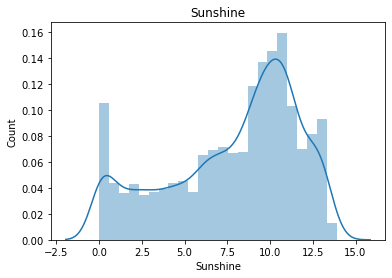

<Figure size 1080x1080 with 0 Axes>

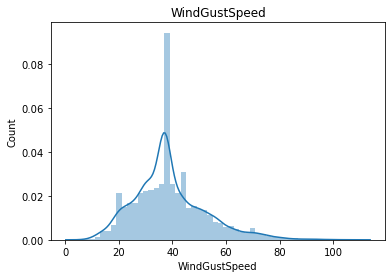

<Figure size 1080x1080 with 0 Axes>

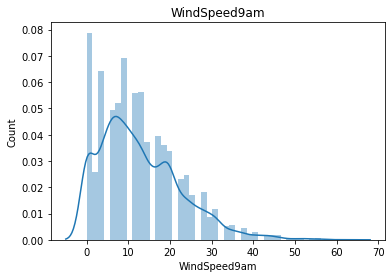

<Figure size 1080x1080 with 0 Axes>

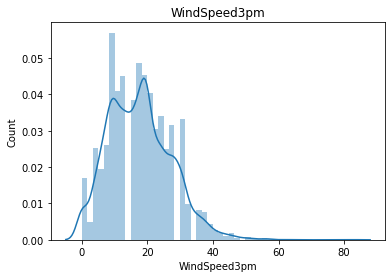

<Figure size 1080x1080 with 0 Axes>

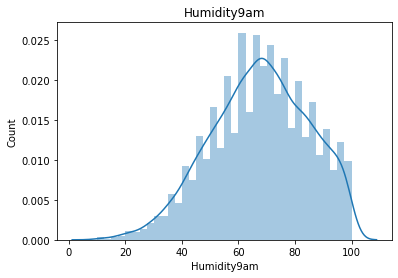

<Figure size 1080x1080 with 0 Axes>

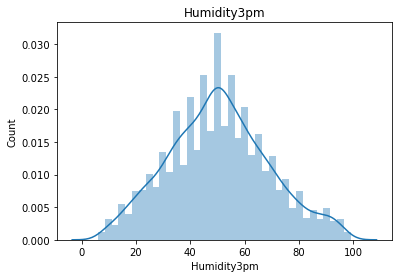

<Figure size 1080x1080 with 0 Axes>

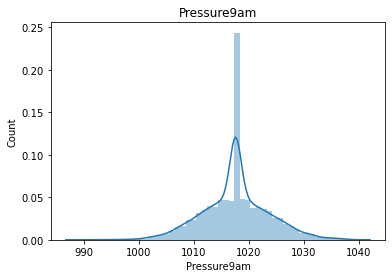

<Figure size 1080x1080 with 0 Axes>

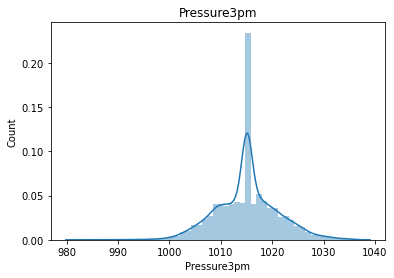

<Figure size 1080x1080 with 0 Axes>

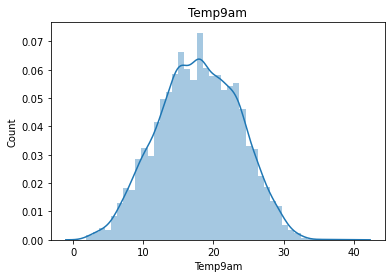

<Figure size 1080x1080 with 0 Axes>

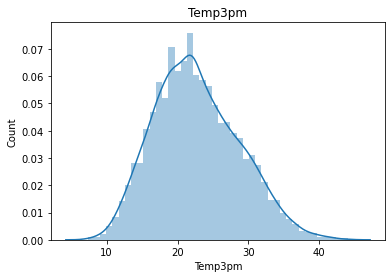

<Figure size 1080x1080 with 0 Axes>

In [22]:
# Checking Distribution of contineous_features
for feature in continuous_feature:
    data= df.copy()
    sns.distplot(df[feature])
    plt.xlabel(feature)
    plt.ylabel("Count")
    plt.title(feature)
    plt.figure(figsize=(15,15))
    plt.show()

```
Observation:
    
here few columns are highly skewed
```

#### boxplot for all the continuous features to see the outliers

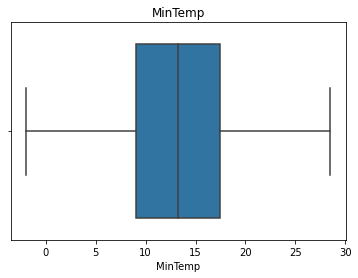

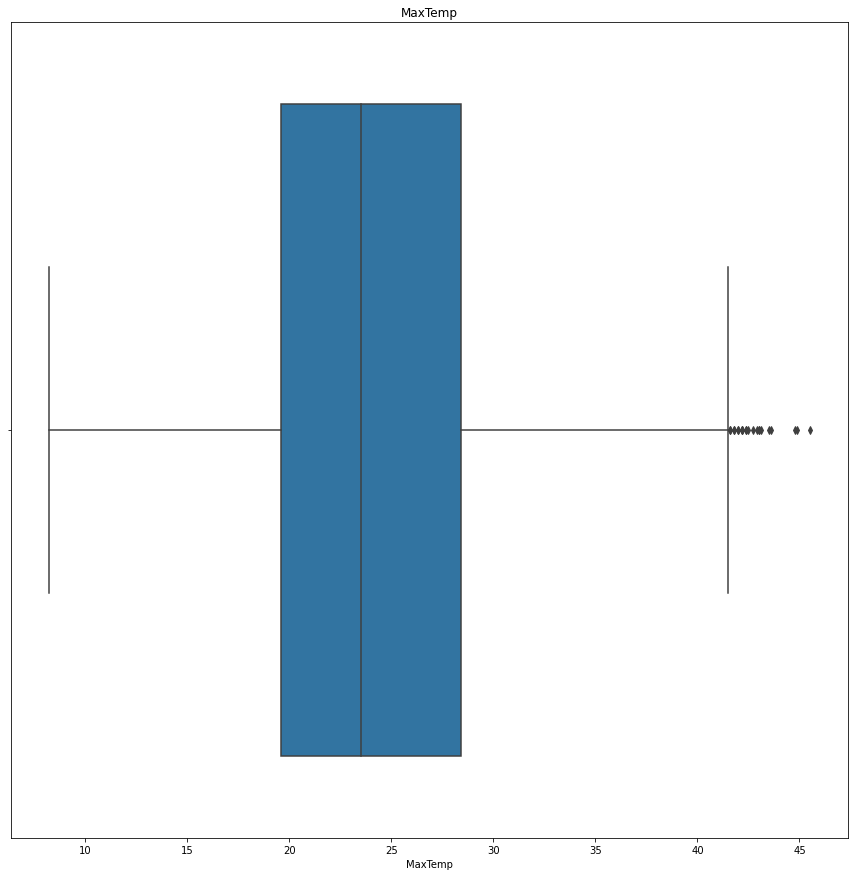

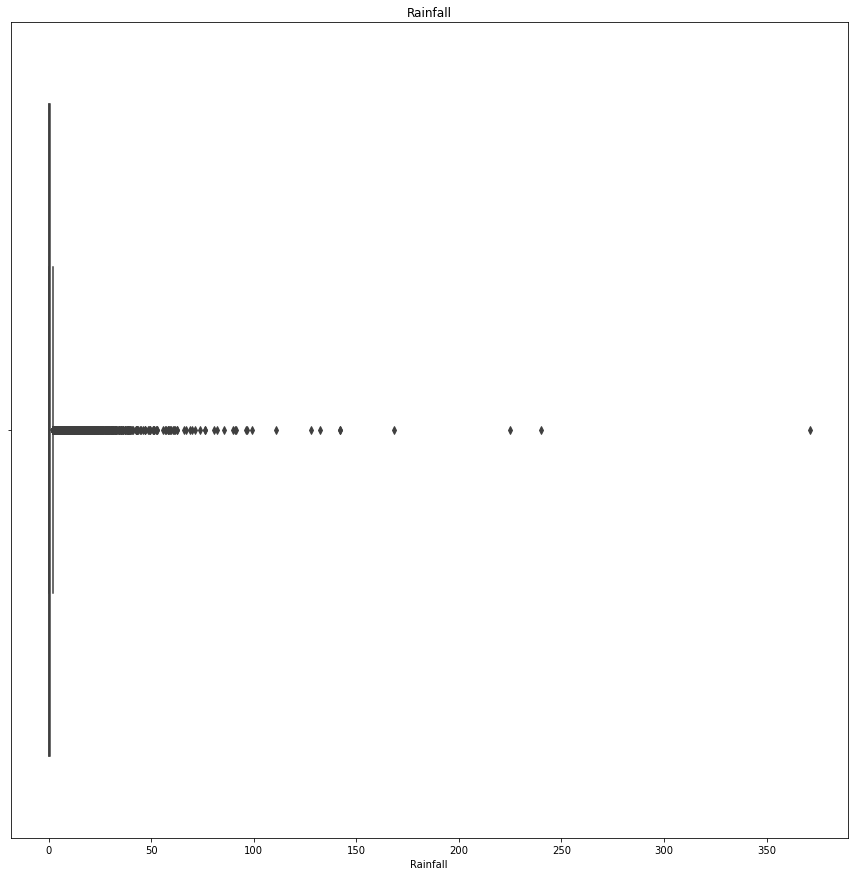

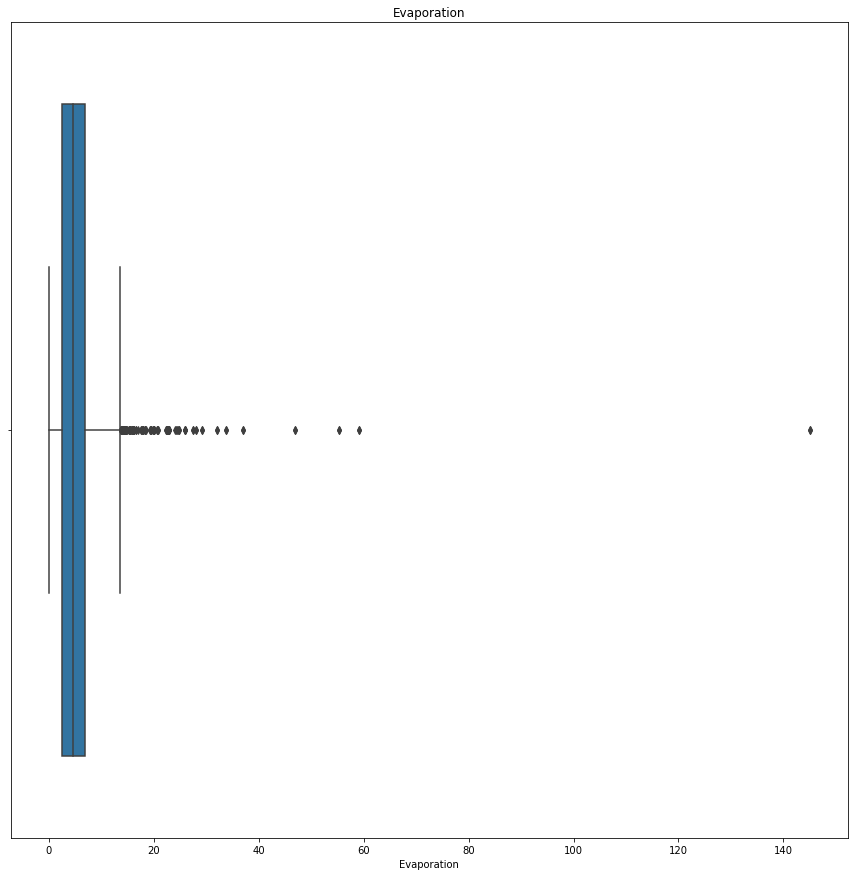

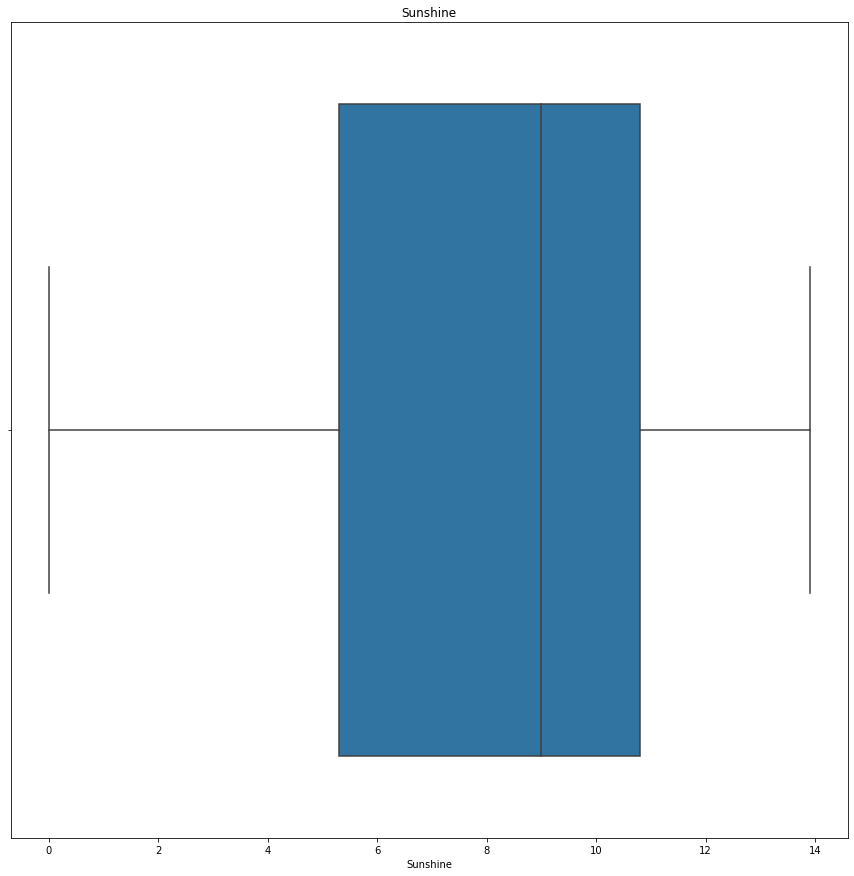

...

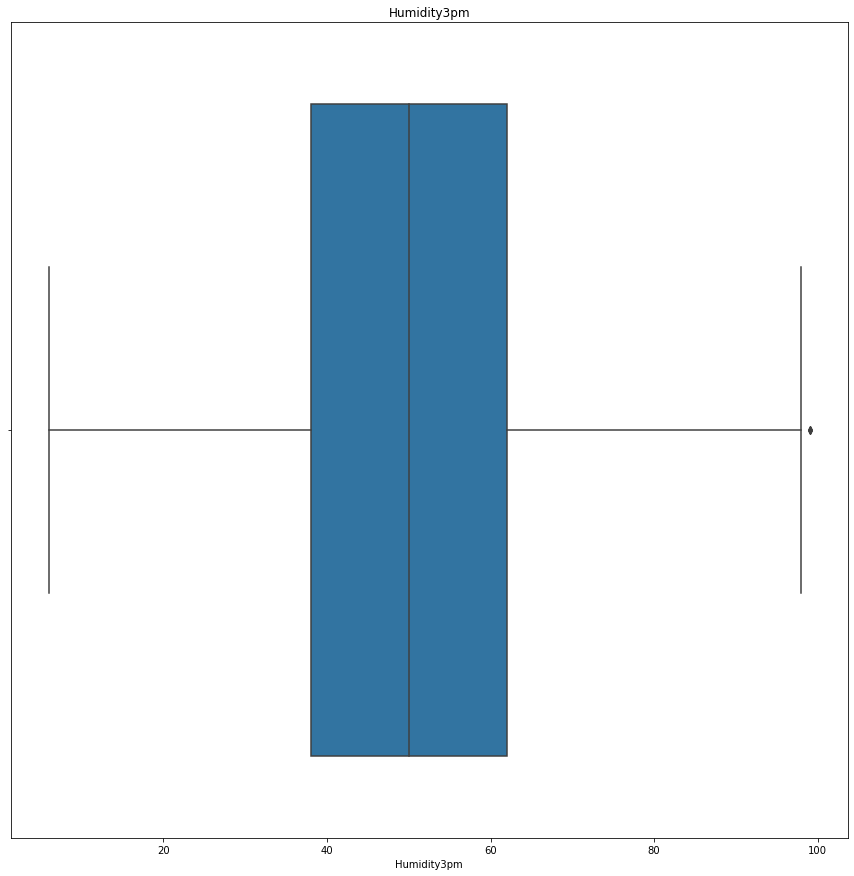

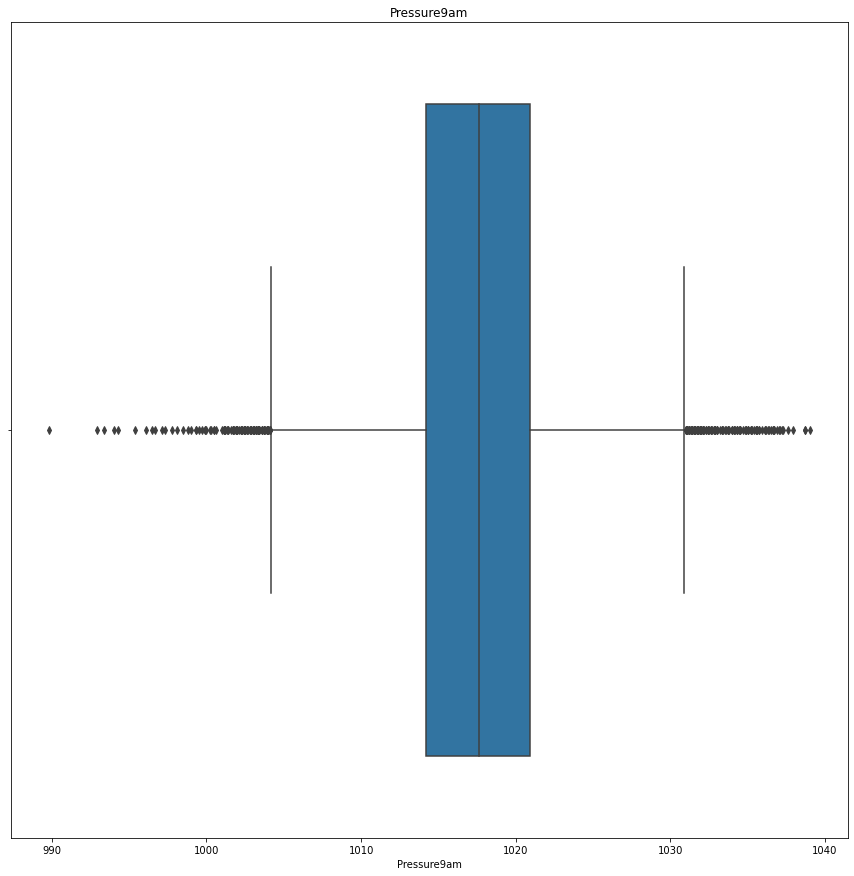

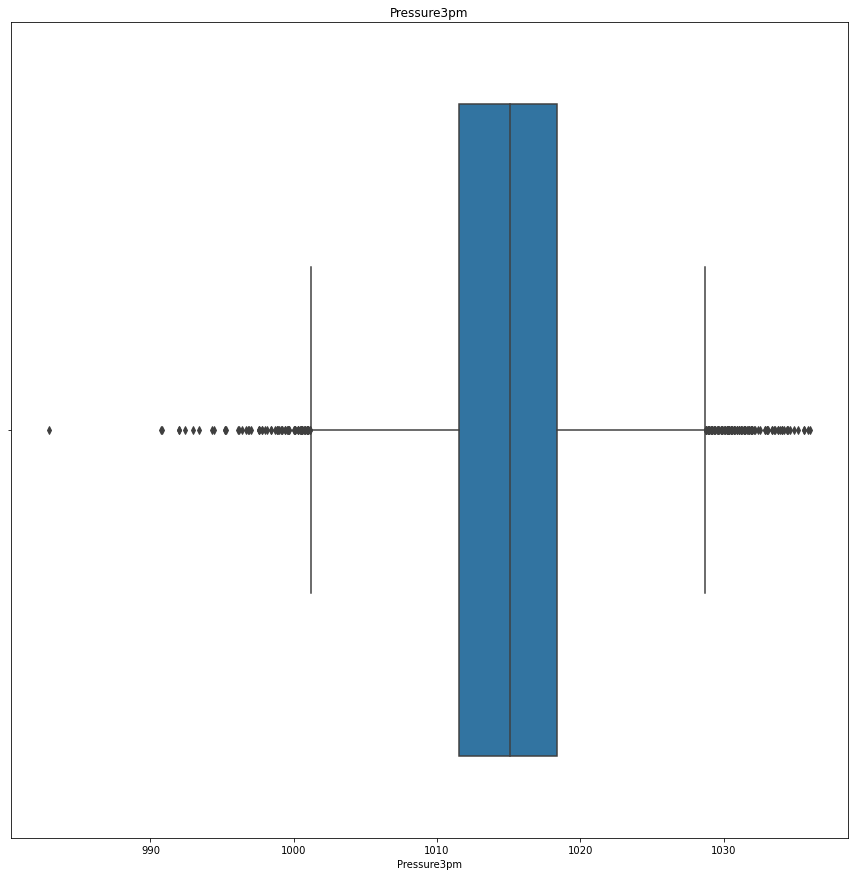

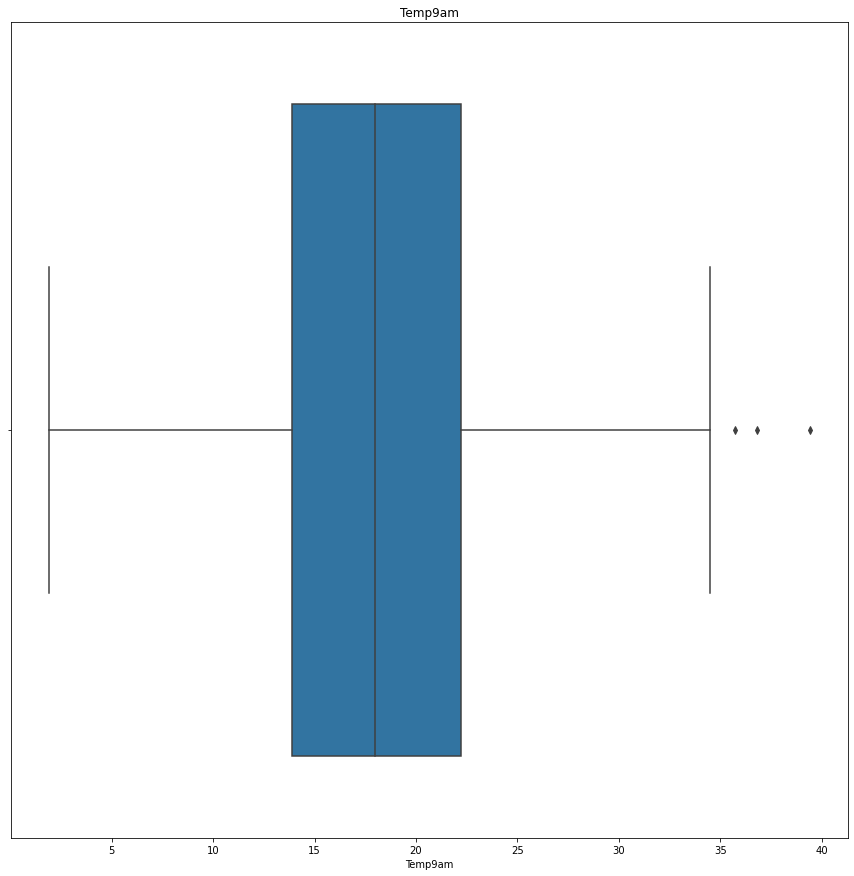

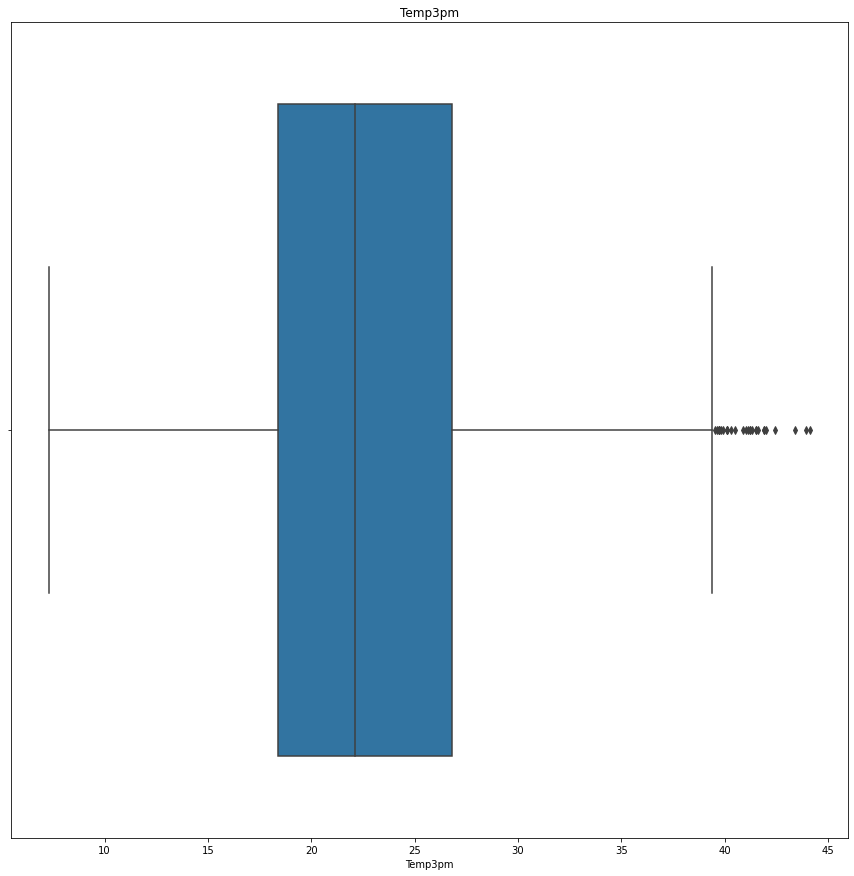

<Figure size 1080x1080 with 0 Axes>

In [23]:
#A for loop is used to plot a boxplot for all the continuous features to see the outliers
for feature in continuous_feature:
    data=df.copy()
    sns.boxplot(data[feature])
    plt.title(feature)
    plt.figure(figsize=(15,15));

```
Observation:
There are outliers in almost every column
```

#### Finding Relation between Location and RainTomorrow

In [24]:
df1 = df.groupby(["Location"])["RainTomorrow"].value_counts().sort_values().unstack()

In [25]:
df1

RainTomorrow,0,1
Location,,
Adelaide,160.0,45.0
Albury,708.0,199.0
Brisbane,444.0,135.0
CoffsHarbour,425.0,186.0
Darwin,218.0,32.0
Melbourne,608.0,203.0
Newcastle,624.0,198.0
Penrith,366.0,116.0
PerthAirport,962.0,242.0


#### Analysis of Rainfall Data by Location

In this analysis, we have examined the distribution of rainy and non-rainy days (represented as 1 and 0, respectively) for different locations. The following are the key observations:

1. **Location with the Highest Rainy Days:** "PerthAirport" experiences the highest count of rainy days (1) with a total of 962, indicating that it frequently encounters rainy weather.

2. **Location with the Lowest Rainy Days:** "Uluru" has the lowest count of rainy days (1) with only 39. However, it's important to note that there are missing values (NaN) for non-rainy days (0) in the "Uluru" location.

3. **Variability Across Locations:** There is a significant variability in the distribution of rainy and non-rainy days across different locations. Some locations, such as "Darwin" and "CoffsHarbour," have a relatively higher proportion of rainy days compared to others.

4. **Location with a High Total Count:** "Albury" has a relatively high total count of both rainy and non-rainy days, indicating a substantial amount of data for this location.

5. **Missing Values:** Some locations have missing values (NaN) for non-rainy days, which may require further investigation or handling, depending on the analysis's goals.

These observations provide valuable insights into regional rainfall patterns and can be used for further analysis or decision-making related to weather forecasts and planning.


In [26]:
#Shorting in descending order
df1[1].sort_values(ascending = False)

Location
PerthAirport    242.0
Melbourne       203.0
Albury          199.0
Newcastle       198.0
CoffsHarbour    186.0
Williamtown     153.0
Brisbane        135.0
Penrith         116.0
Wollongong       63.0
Adelaide         45.0
Darwin           32.0
Uluru             NaN
Name: 1, dtype: float64

In [27]:
df1[1].sort_values(ascending = False).index

Index(['PerthAirport', 'Melbourne', 'Albury', 'Newcastle', 'CoffsHarbour',
       'Williamtown', 'Brisbane', 'Penrith', 'Wollongong', 'Adelaide',
       'Darwin', 'Uluru'],
      dtype='object', name='Location')

In [28]:
len(df1[1].sort_values(ascending = False).index)

12

In [29]:

location = {'PerthAirport':1, 'Melbourne':2, 'Albury':3, 'Newcastle':4, 'CoffsHarbour':5,
       'Williamtown':6, 'Brisbane':7, 'Penrith':8, 'Wollongong':9, 'Adelaide':10,
       'Darwin':11, 'Uluru':12}
df["Location"] = df["Location"].map(location)

```
we arranged all the locations in descending order according to their Rainfall and then we encoded all the locations
```

In [30]:
# Converting Date Column into Datetimr format
df["Date"] = pd.to_datetime(df["Date"], format = "%Y-%m-%dT", errors = "coerce")

In [31]:
df["Date_month"] = df["Date"].dt.month
df["Date_day"] = df["Date"].dt.day

In [32]:
# Dropping Date Column Because i have created Month And day from this
df.drop('Date',axis=1,inplace=True)

In [33]:
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Date_month,Date_day
0,3,13.4,22.9,0.6,4.2,3.8,4.0,44.0,5.0,3.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,0,0,12,1
1,3,7.4,25.1,0.0,8.0,9.9,2.0,44.0,0.0,6.0,4.0,22.0,44.0,25.0,1010.6,1007.8,4.0,1.0,17.2,24.3,0,0,12,2
2,3,12.9,25.7,0.0,2.0,5.8,5.0,46.0,5.0,6.0,19.0,26.0,38.0,30.0,1007.6,1008.7,8.0,2.0,21.0,23.2,0,0,12,3
3,3,9.2,28.0,0.0,2.8,10.1,11.0,24.0,13.0,14.0,11.0,9.0,45.0,16.0,1017.6,1012.8,0.0,2.0,18.1,26.5,0,0,12,4
4,3,17.5,32.3,1.0,1.2,9.5,4.0,41.0,12.0,0.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,12,2.8,23.4,0.0,7.6,9.9,15.0,31.0,13.0,13.0,13.0,11.0,51.0,24.0,1024.6,1020.3,7.0,4.0,10.1,22.4,0,0,6,21
8421,12,3.6,25.3,0.0,9.4,12.1,0.0,22.0,13.0,2.0,13.0,9.0,56.0,21.0,1023.5,1019.1,1.0,5.0,10.9,24.5,0,0,6,22
8422,12,5.4,26.9,0.0,2.4,6.7,3.0,37.0,13.0,3.0,9.0,9.0,53.0,24.0,1021.0,1016.8,8.0,6.0,12.5,26.1,0,0,6,23
8423,12,7.8,27.0,0.0,4.0,0.0,12.0,28.0,11.0,2.0,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,0,0,6,24


<AxesSubplot:xlabel='RainTomorrow', ylabel='count'>

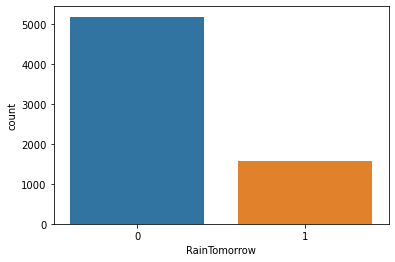

In [34]:
sns.countplot(df["RainTomorrow"])

Our target Column is imbalances

#### checking Outliers 

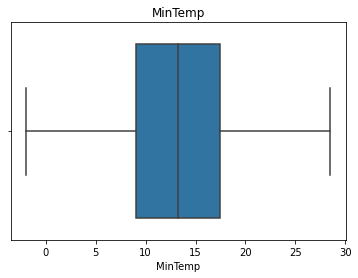

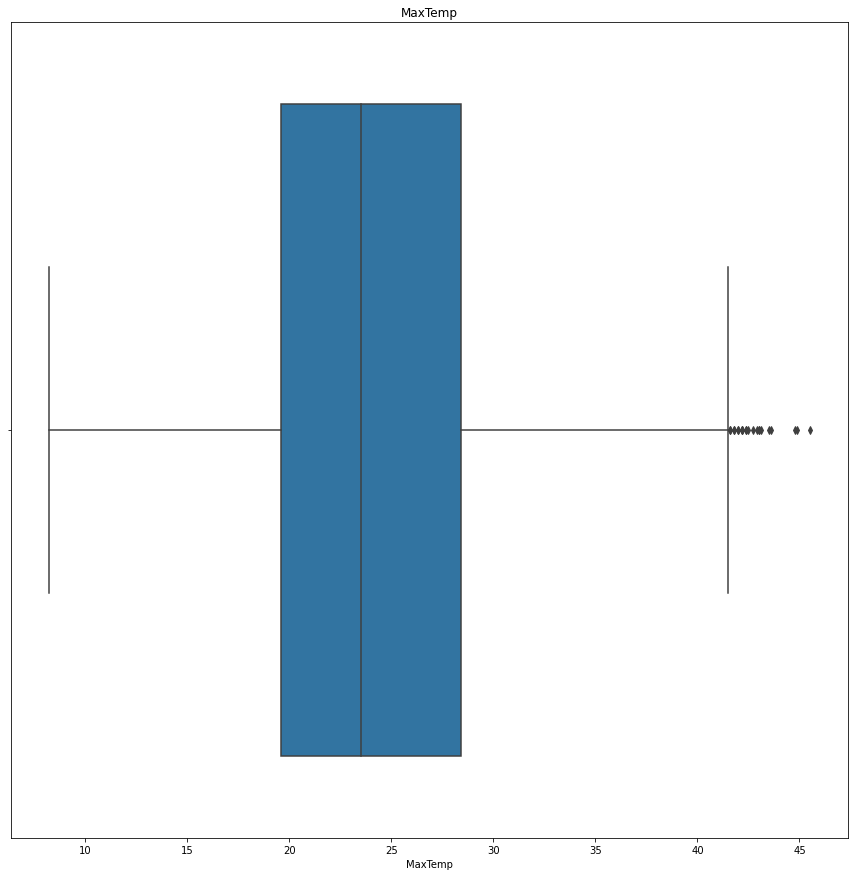

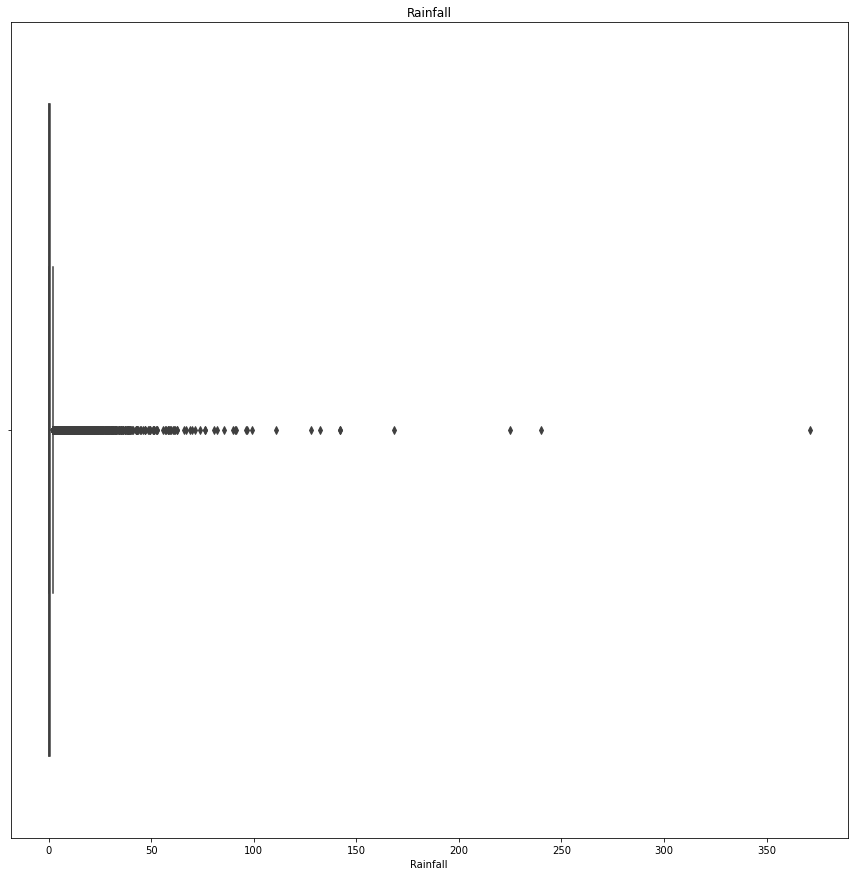

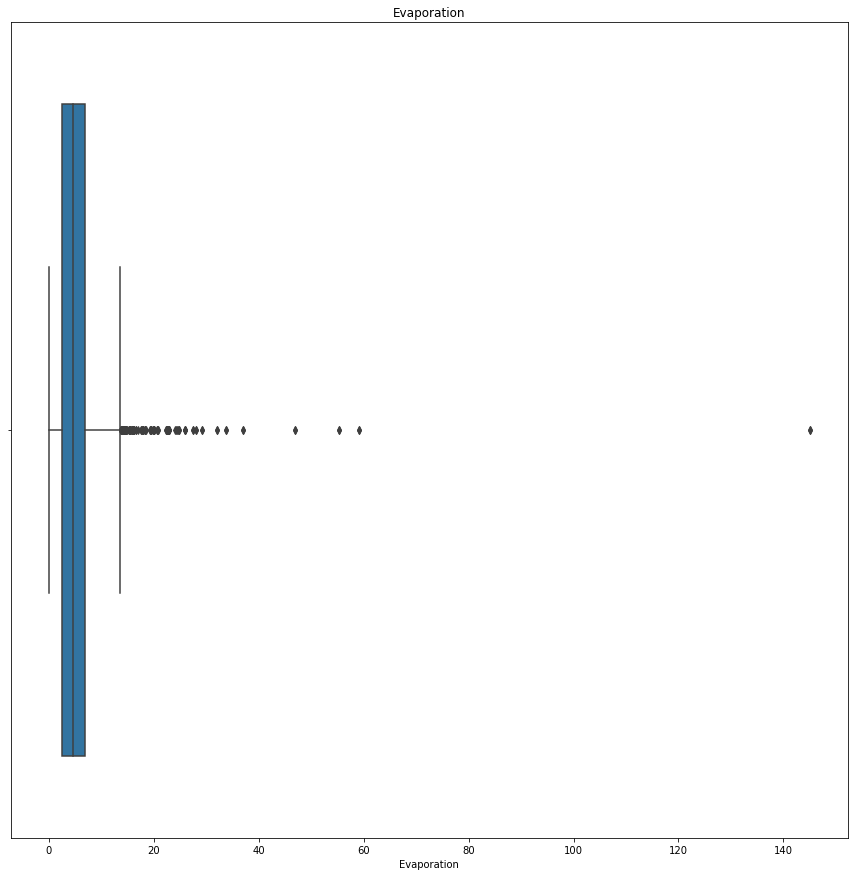

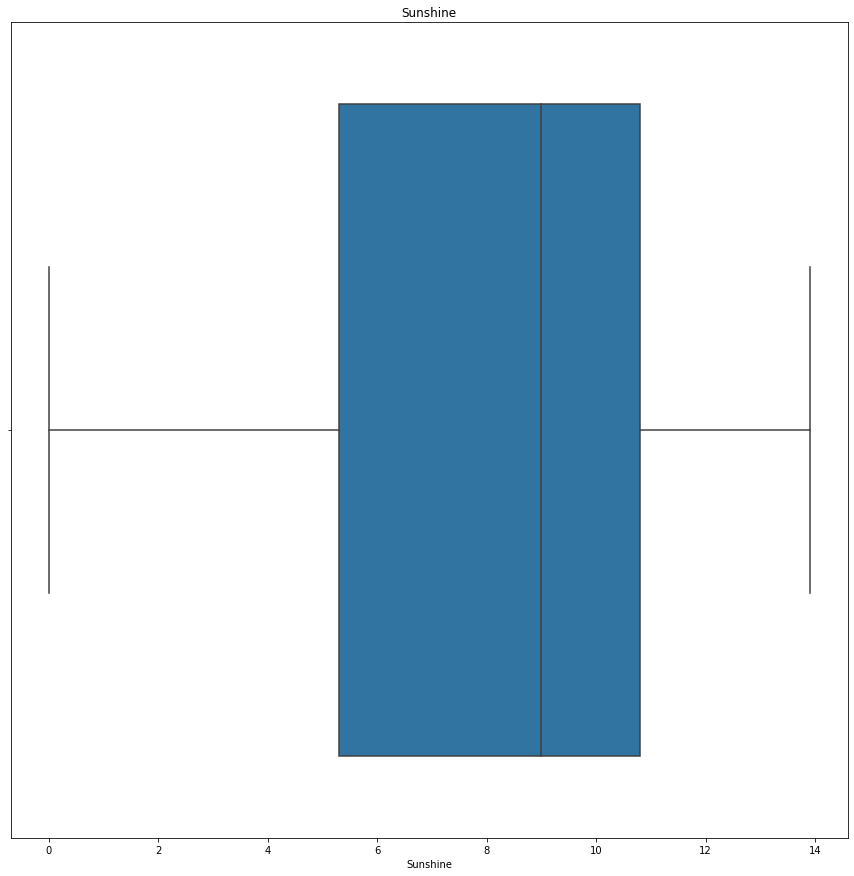

...

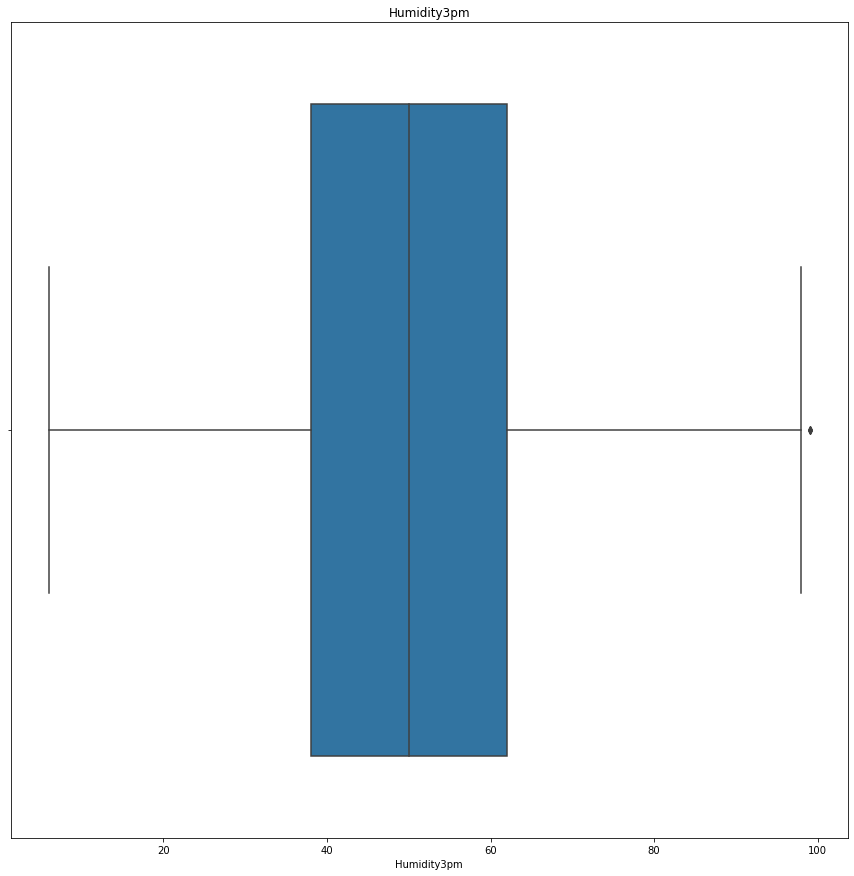

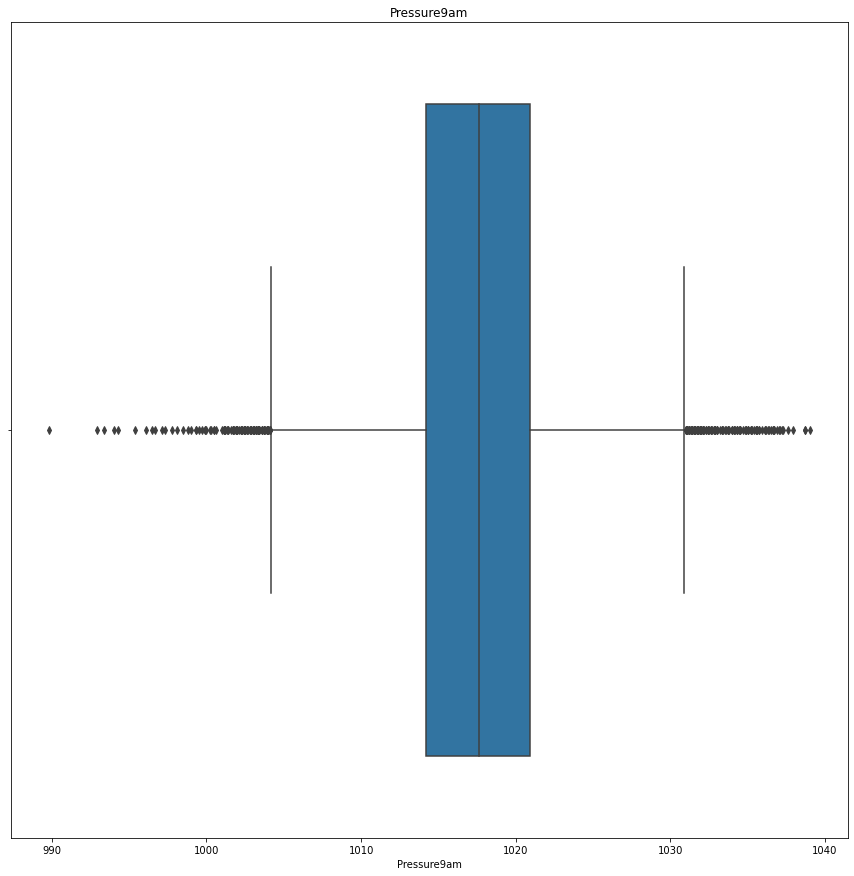

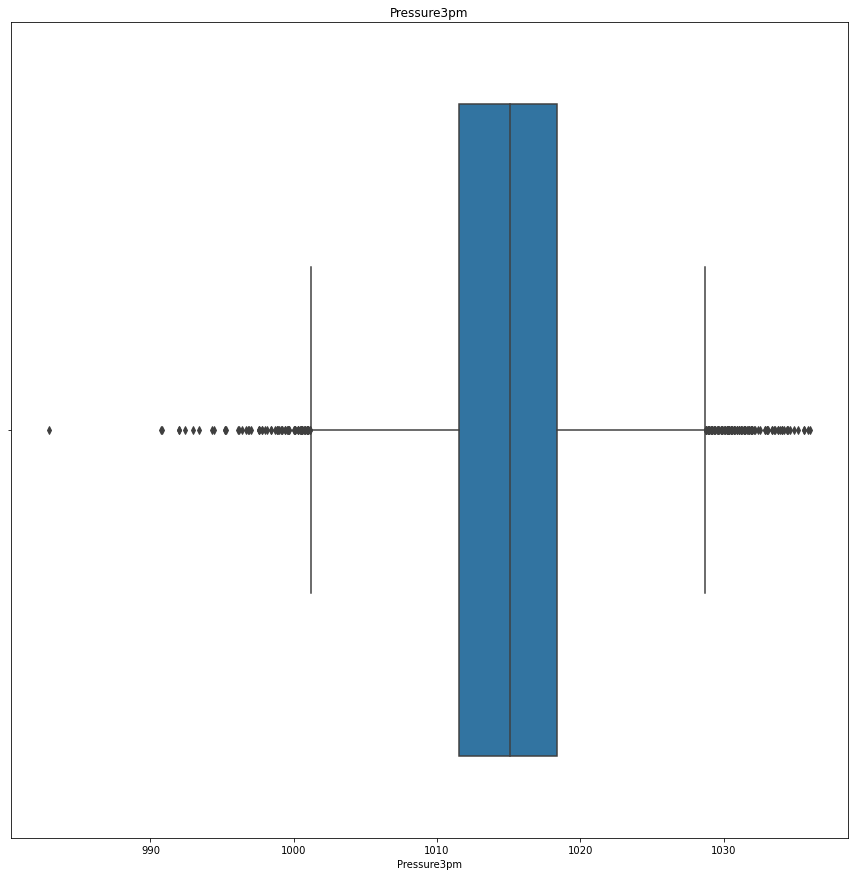

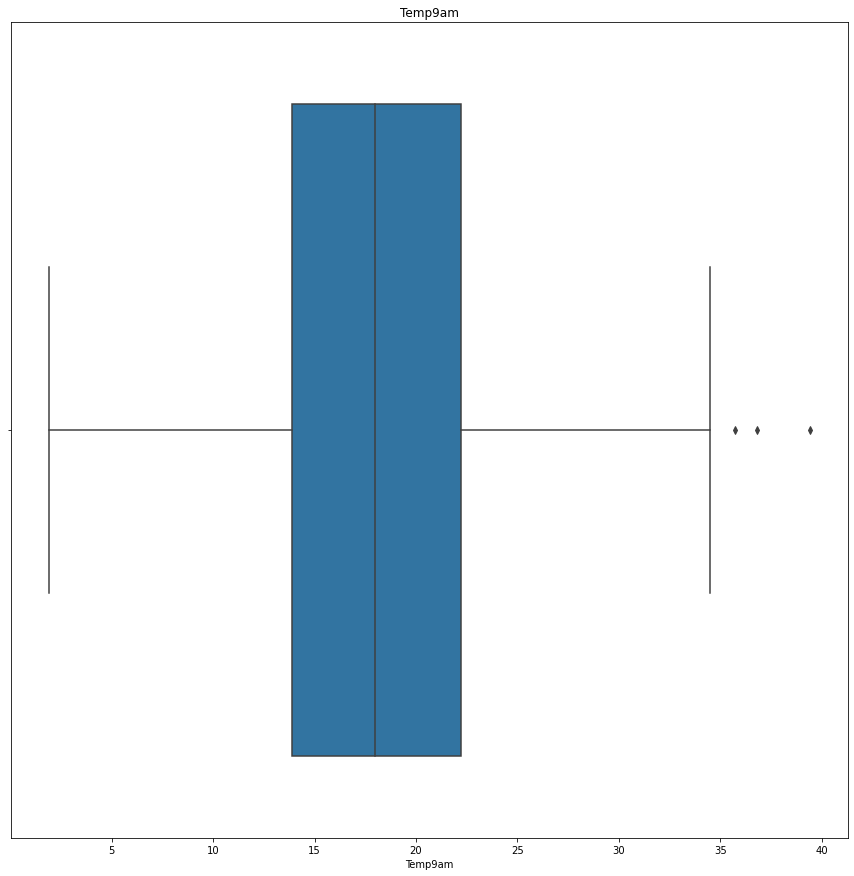

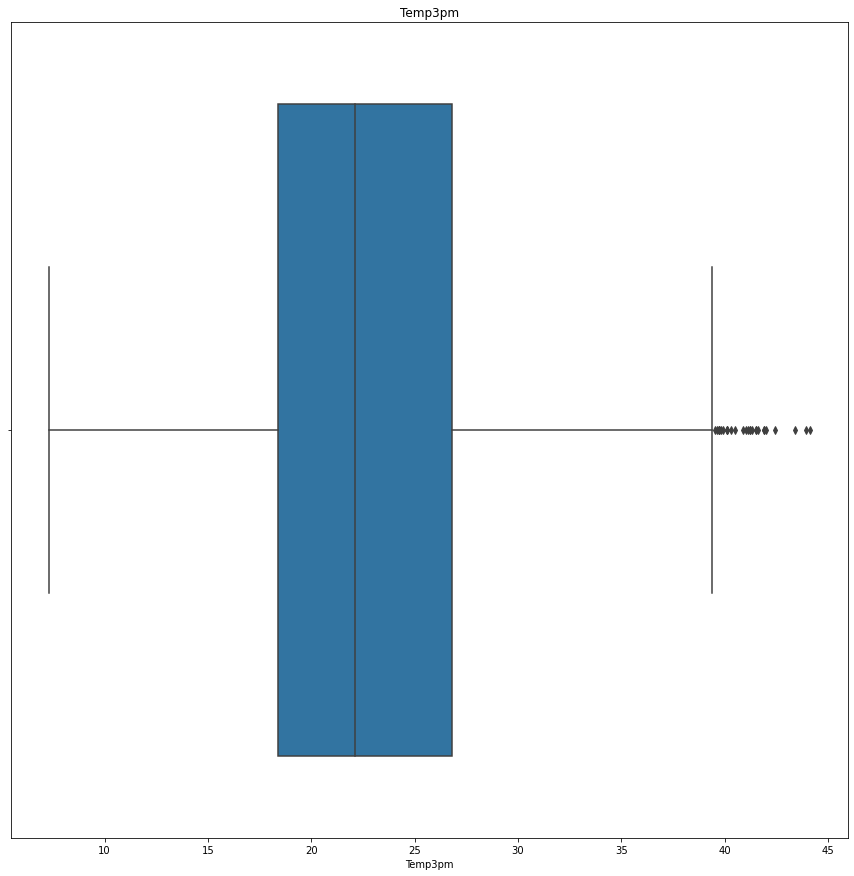

<Figure size 1080x1080 with 0 Axes>

In [35]:
for feature in continuous_feature:
    data=df.copy()
    sns.boxplot(data[feature])
    plt.title(feature)
    plt.figure(figsize=(15,15))

In [36]:
for feature in continuous_feature:
    print(feature)

MinTemp
MaxTemp
Rainfall
Evaporation
Sunshine
WindGustSpeed
WindSpeed9am
WindSpeed3pm
Humidity9am
Humidity3pm
Pressure9am
Pressure3pm
Temp9am
Temp3pm


#### Removing Outliers from Contineous Feature By Quantile Method

In [37]:
#MinTemp
IQR=df.MinTemp.quantile(0.75)-df.MinTemp.quantile(0.25)
lower_bridge=df.MinTemp.quantile(0.25)-(IQR*1.5)
upper_bridge=df.MinTemp.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

-3.599999999999998 29.999999999999996


In [38]:
df.loc[df['MinTemp']>=29.99,'MinTemp']=29.99
df.loc[df['MinTemp']<=-3.59,'MinTemp']=-3.59

In [39]:
#MaxTemp
IQR=df.MaxTemp.quantile(0.75)-df.MaxTemp.quantile(0.25)
lower_bridge=df.MaxTemp.quantile(0.25)-(IQR*1.5)
upper_bridge=df.MaxTemp.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

6.400000000000006 41.599999999999994


In [40]:
df.loc[df['MaxTemp']>=41.59,'MaxTemp']=41.59
df.loc[df['MaxTemp']<=6.40,'MaxTemp']=6.40

In [41]:
#Rainfall
IQR=df.Rainfall.quantile(0.75)-df.Rainfall.quantile(0.25)
lower_bridge=df.Rainfall.quantile(0.25)-(IQR*1.5)
upper_bridge=df.Rainfall.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

-1.2000000000000002 2.0


In [42]:
df.loc[df['Rainfall']>=2.0,'Rainfall']=2.0
df.loc[df['Rainfall']<=-1.20,'Rainfall']=-1.20

In [43]:
#Evaporation
IQR=df.Evaporation.quantile(0.75)-df.Evaporation.quantile(0.25)
lower_bridge=df.Evaporation.quantile(0.25)-(IQR*1.5)
upper_bridge=df.Evaporation.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

-4.0 13.600000000000001


In [44]:
df.loc[df['Evaporation']>=13.60,'Evaporation']=13.60
df.loc[df['Evaporation']<=-4.0,'Evaporation']=-4.0

In [45]:
#WindGustSpeed
IQR=df.WindGustSpeed.quantile(0.75)-df.WindGustSpeed.quantile(0.25)
lower_bridge=df.WindGustSpeed.quantile(0.25)-(IQR*1.5)
upper_bridge=df.WindGustSpeed.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

6.0 70.0


In [46]:
df.loc[df['WindGustSpeed']>=70.0,'WindGustSpeed']=70.0
df.loc[df['WindGustSpeed']<=6.0,'WindGustSpeed']=6.0

In [47]:
#WindSpeed9am
IQR=df.WindSpeed9am.quantile(0.75)-df.WindSpeed9am.quantile(0.25)
lower_bridge=df.WindSpeed9am.quantile(0.25)-(IQR*1.5)
upper_bridge=df.WindSpeed9am.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

-13.5 38.5


In [48]:
df.loc[df['WindSpeed9am']>=38.5,'WindSpeed9am']=38.5
df.loc[df['WindSpeed9am']<=-13.5,'WindSpeed9am']=-13.5

In [49]:
#WindSpeed3pm
IQR=df.WindSpeed3pm.quantile(0.75)-df.WindSpeed3pm.quantile(0.25)
lower_bridge=df.WindSpeed3pm.quantile(0.25)-(IQR*1.5)
upper_bridge=df.WindSpeed3pm.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

-8.5 43.5


In [50]:
df.loc[df['WindSpeed3pm']>43.5,'WindSpeed3pm']=43.5
df.loc[df['WindSpeed3pm']<=-8.5,'WindSpeed3pm']=-8.5

In [51]:
#Humidity9am
IQR=df.Humidity9am.quantile(0.75)-df.Humidity9am.quantile(0.25)
lower_bridge=df.Humidity9am.quantile(0.25)-(IQR*1.5)
upper_bridge=df.Humidity9am.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

20.0 116.0


In [52]:
df.loc[df['Humidity9am']>=116.0,'Humidity9am']=116.0
df.loc[df['Humidity9am']<=20.0,'Humidity9am']=20.0

In [53]:
#Pressure9am
IQR=df.Pressure9am.quantile(0.75)-df.Pressure9am.quantile(0.25)
lower_bridge=df.Pressure9am.quantile(0.25)-(IQR*1.5)
upper_bridge=df.Pressure9am.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

1004.1500000000001 1030.9499999999998


In [54]:
df.loc[df['Pressure9am']>=1030.94,'Pressure9am']=1030.94
df.loc[df['Pressure9am']<=1004.15,'Pressure9am']=1004.15

In [55]:
#Pressure3pm
IQR=df.Pressure3pm.quantile(0.75)-df.Pressure3pm.quantile(0.25)
lower_bridge=df.Pressure3pm.quantile(0.25)-(IQR*1.5)
upper_bridge=df.Pressure3pm.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

1001.1500000000001 1028.75


In [56]:
df.loc[df['Pressure3pm']>=1028.75,'Pressure3pm']=1028.75
df.loc[df['Pressure3pm']<=1001.15,'Pressure3pm']=1001.15

In [57]:
#Temp9am
IQR=df.Temp9am.quantile(0.75)-df.Temp9am.quantile(0.25)
lower_bridge=df.Temp9am.quantile(0.25)-(IQR*1.5)
upper_bridge=df.Temp9am.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

1.450000000000001 34.65


In [58]:
df.loc[df['Temp9am']>=34.65,'Temp9am']=34.65
df.loc[df['Temp9am']<=1.45,'Temp9am']=1.45

In [59]:
#Temp3pm
IQR=df.Temp3pm.quantile(0.75)-df.Temp3pm.quantile(0.25)
lower_bridge=df.Temp3pm.quantile(0.25)-(IQR*1.5)
upper_bridge=df.Temp3pm.quantile(0.75)+(IQR*1.5)
print(lower_bridge, upper_bridge)

5.799999999999995 39.400000000000006


In [60]:
df.loc[df['Temp3pm']>=39.40,'Temp3pm']=39.40
df.loc[df['Temp3pm']<=5.79,'Temp3pm']=5.79

#### Boxplot After Removing Outliers

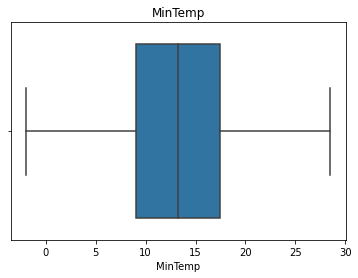

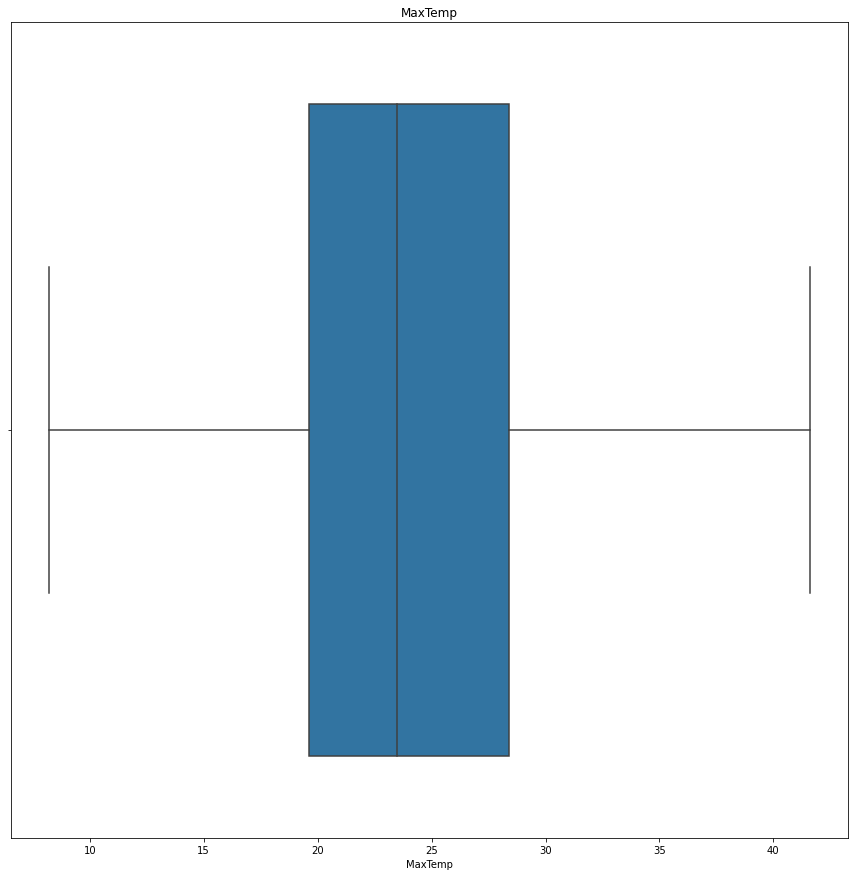

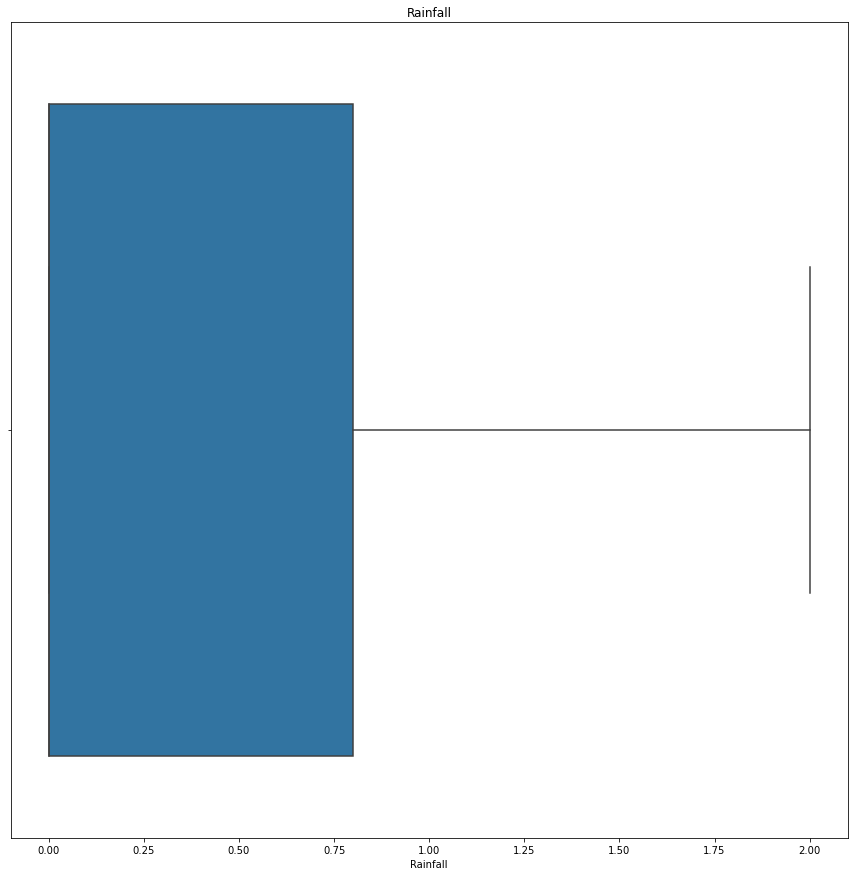

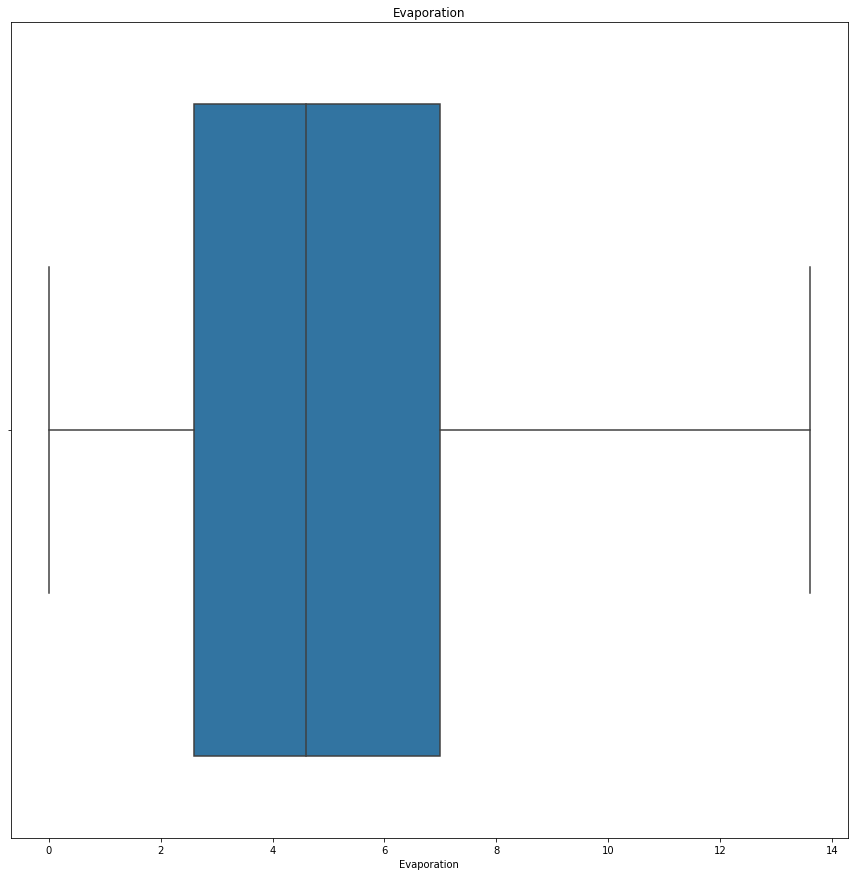

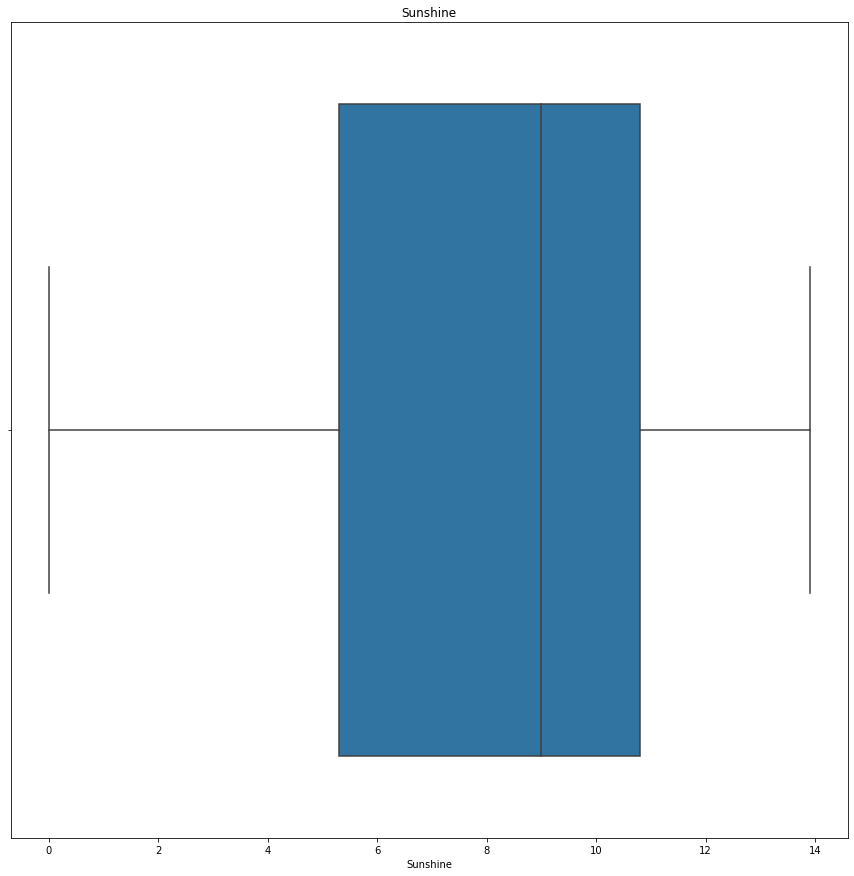

...

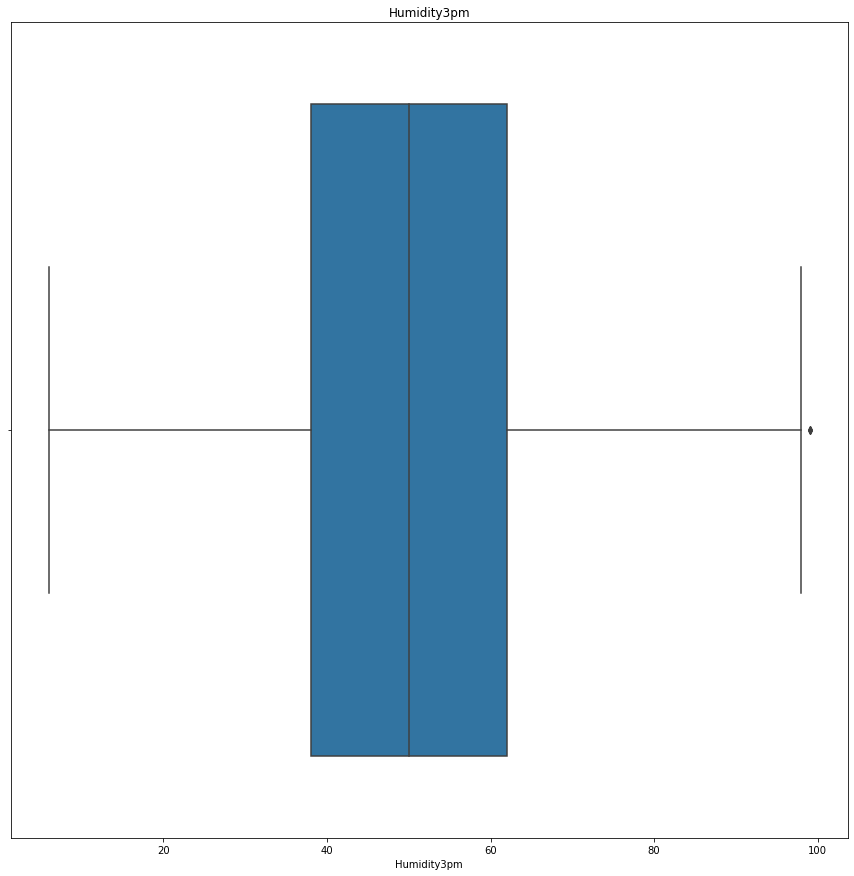

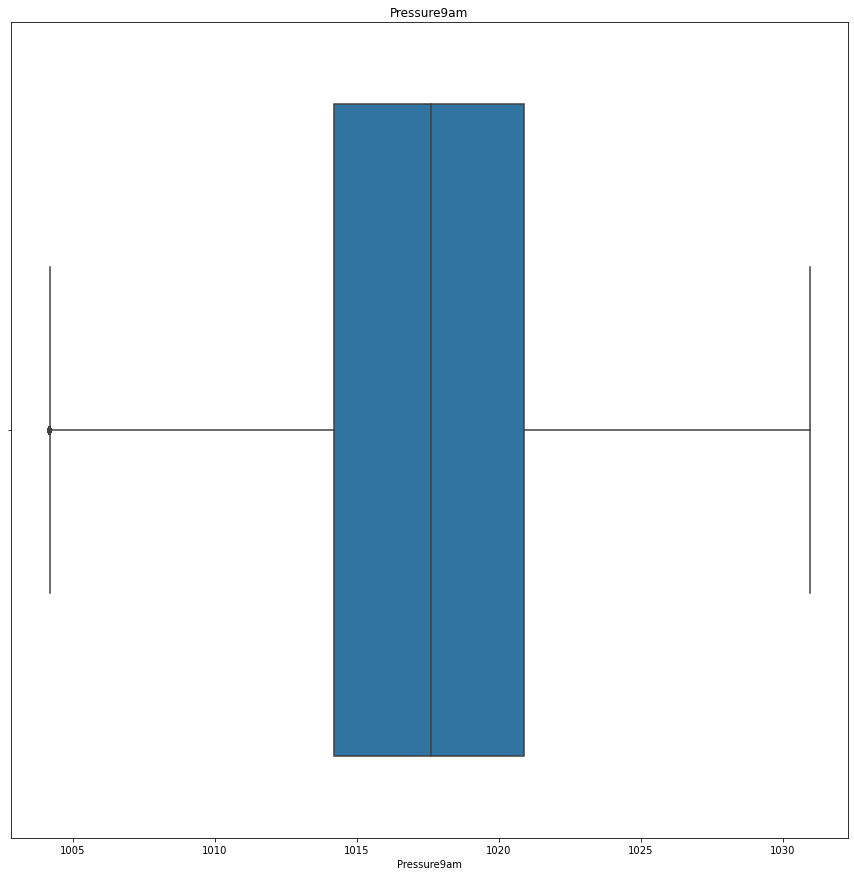

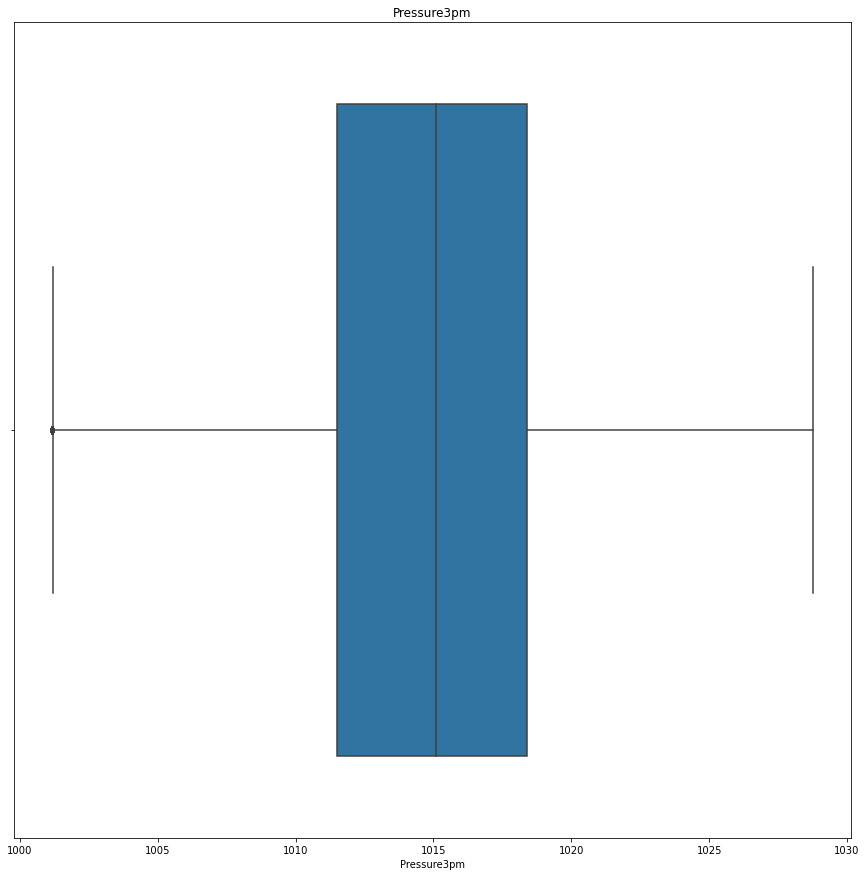

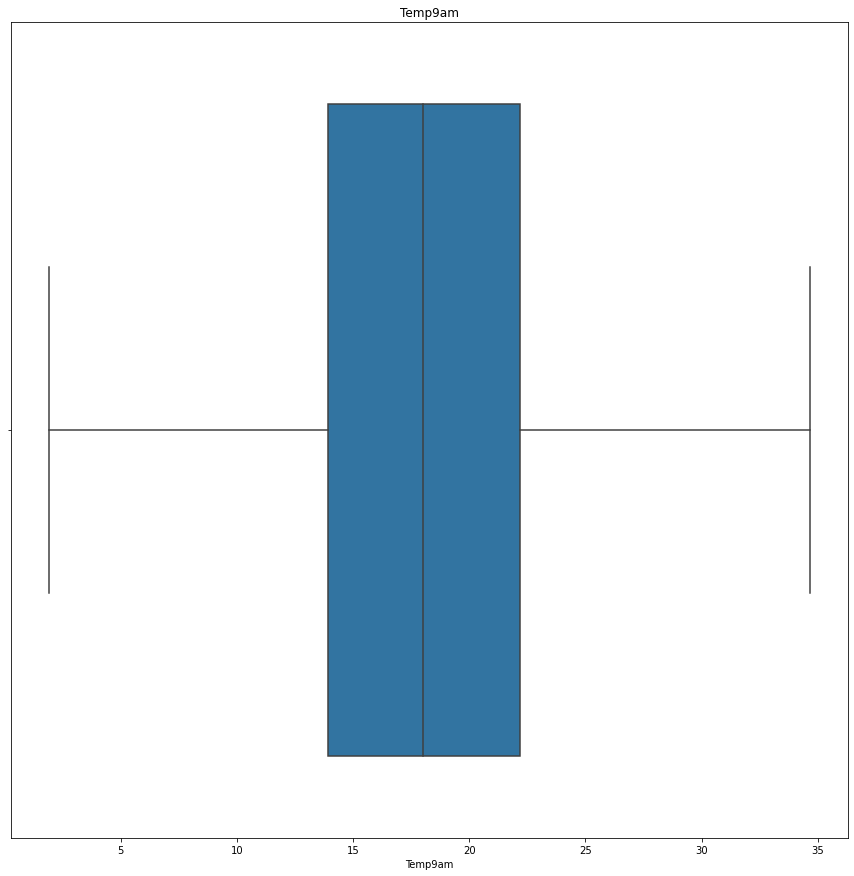

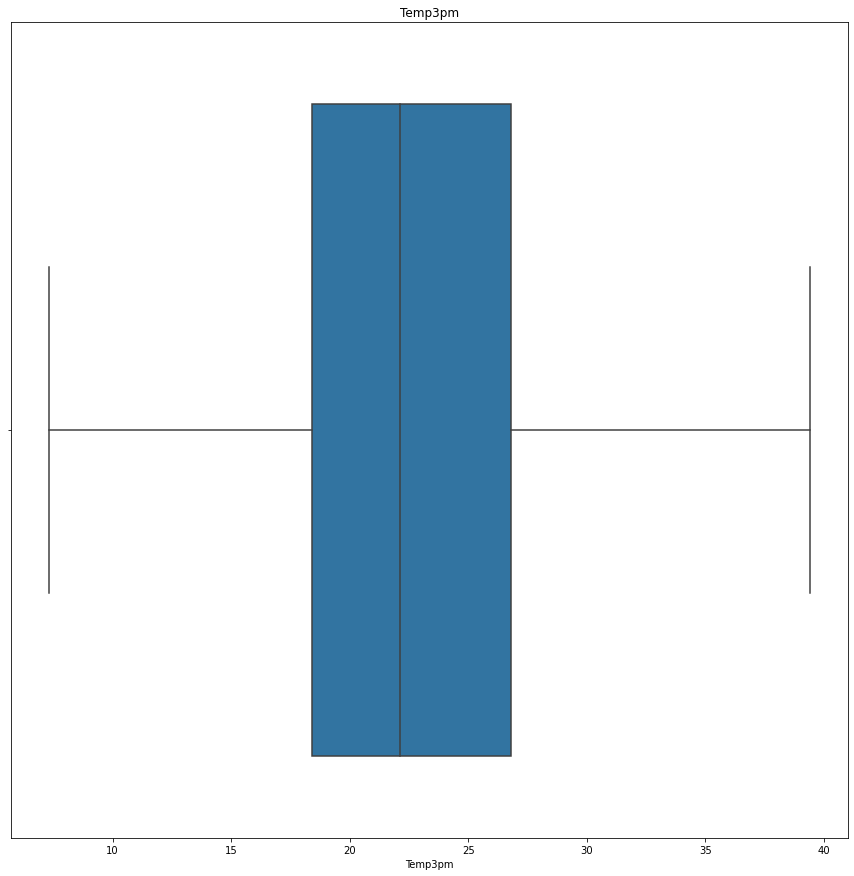

<Figure size 1080x1080 with 0 Axes>

In [61]:
for feature in continuous_feature:
    data=df.copy()
    sns.boxplot(data[feature])
    plt.title(feature)
    plt.figure(figsize=(15,15))

#### Here i am SavingCleaned Data Because i have to make 2 models in this project

In [62]:
file_path = "clean_data.csv"
df.to_csv(file_path, index=False)

#### Here i am checking Distribution of contineous feature by QQ Plot

In [63]:
def qq_plots(df, variable):
    plt.figure(figsize=(15,6))
    plt.subplot(1, 2, 1)
    df[variable].hist()
    plt.subplot(1, 2, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.show()

MinTemp


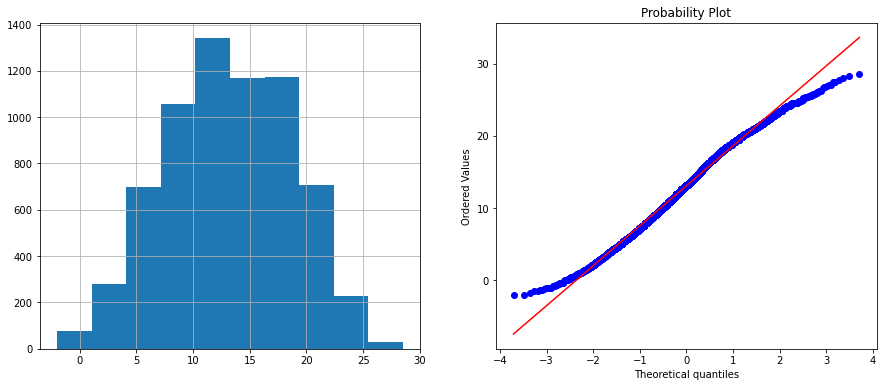

MaxTemp


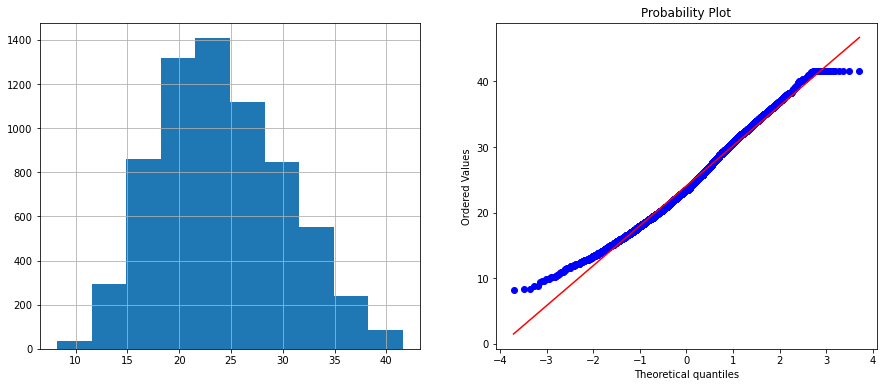

Rainfall


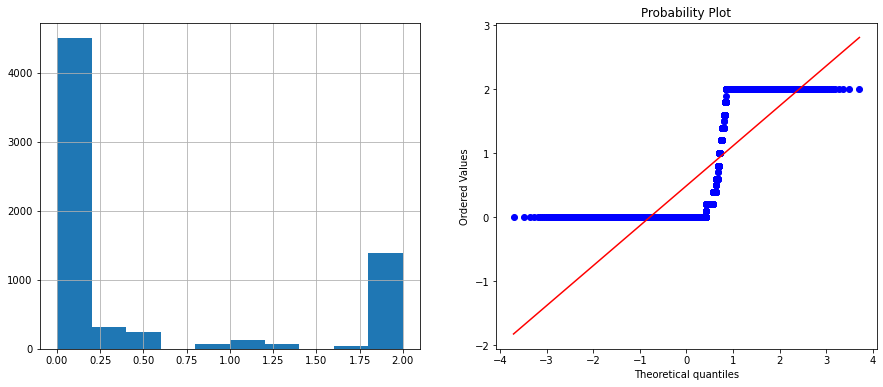

Evaporation


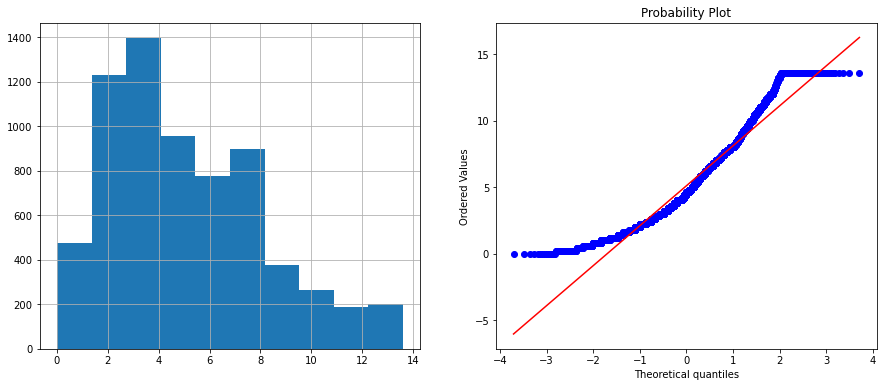

Sunshine


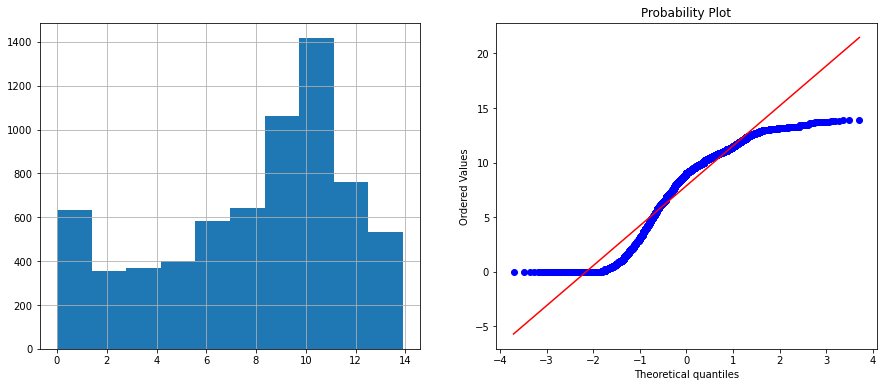

WindGustSpeed


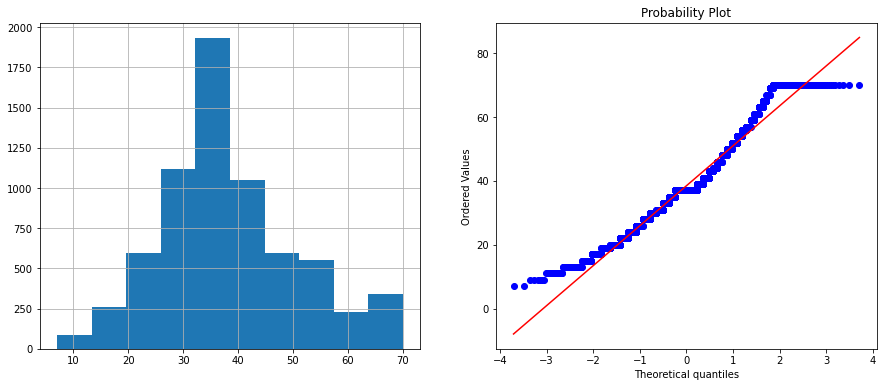

WindSpeed9am


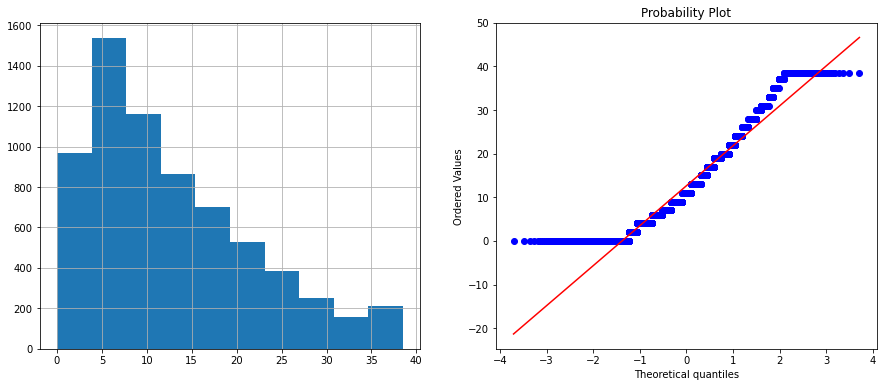

WindSpeed3pm


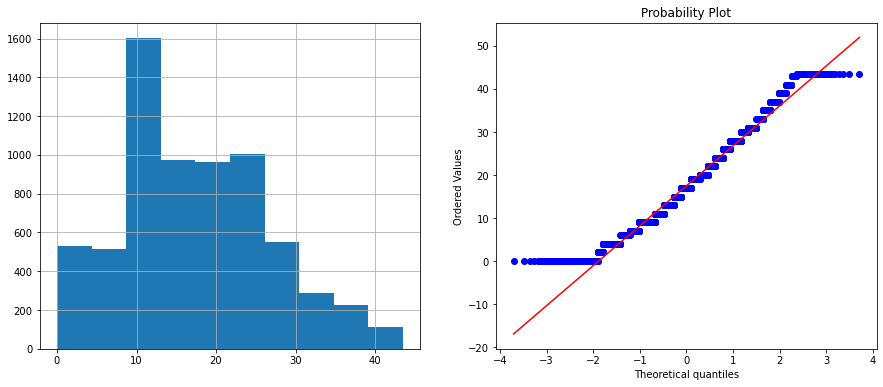

Humidity9am


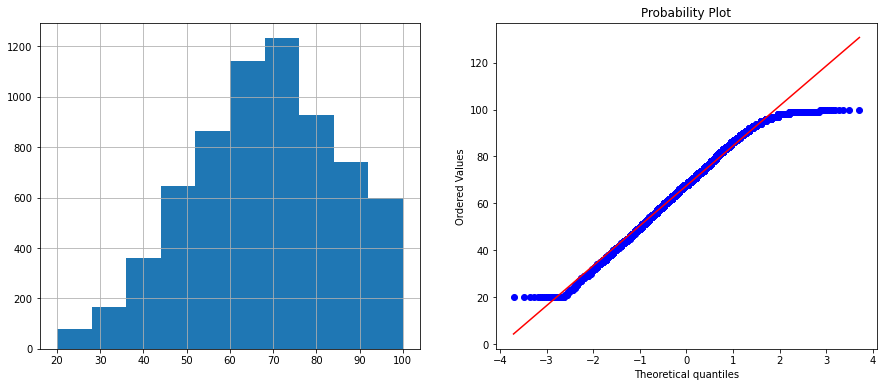

Humidity3pm


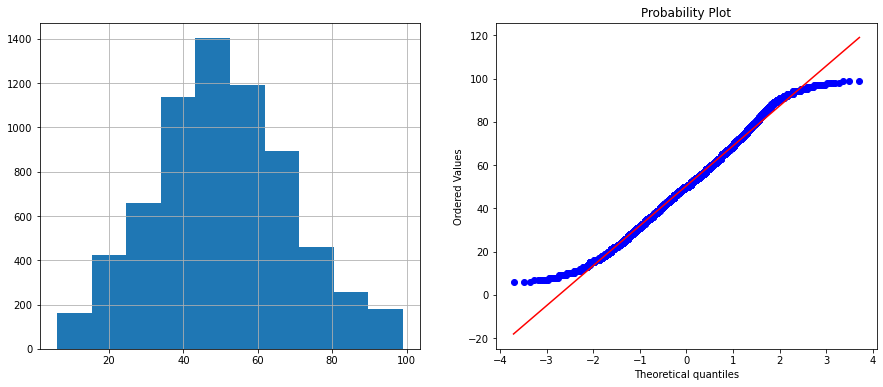

Pressure9am


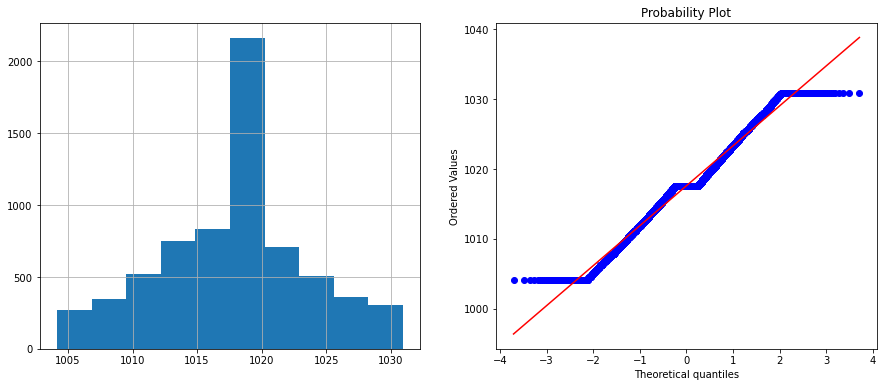

Pressure3pm


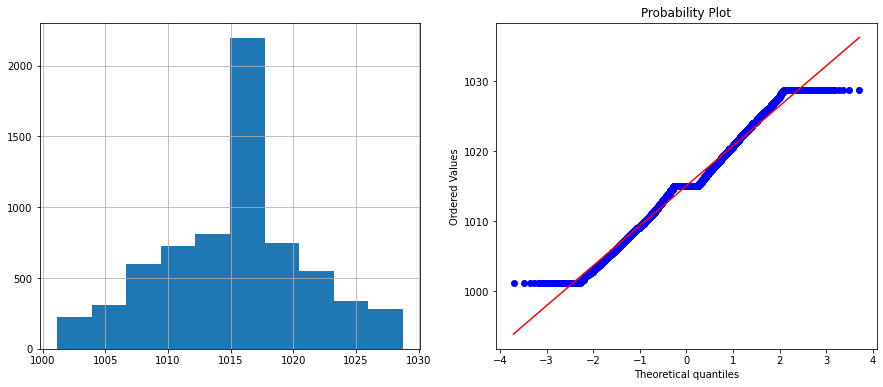

Temp9am


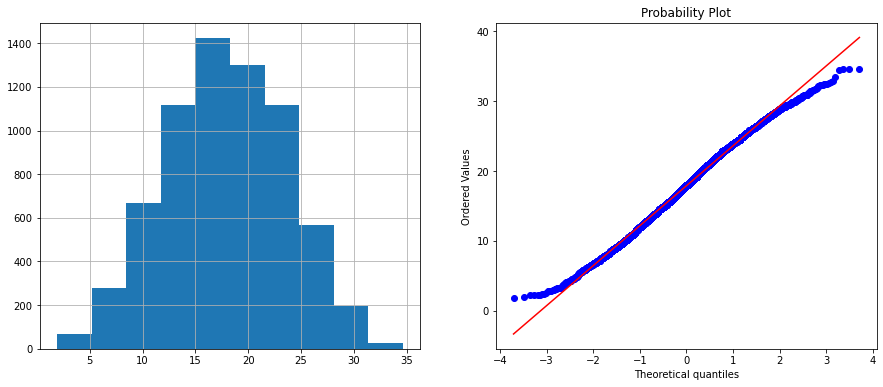

Temp3pm


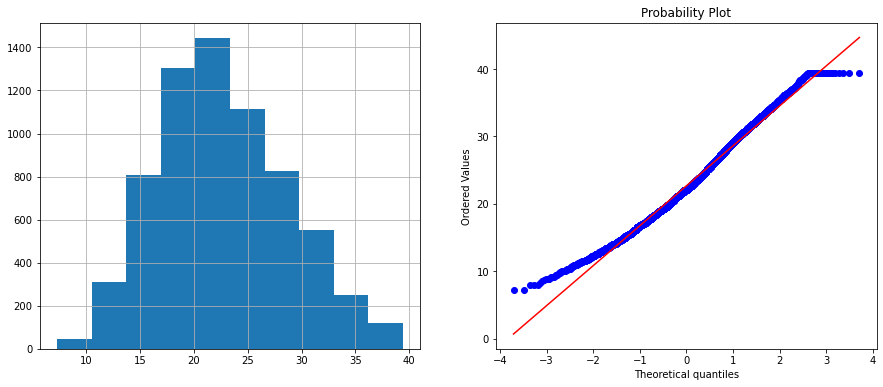

In [64]:
for feature in continuous_feature:
    print(feature)
    plt.figure(figsize=(15,6))
    plt.subplot(1, 2, 1)
    df[feature].hist()
    plt.subplot(1, 2, 2)
    stats.probplot(df[feature], dist="norm", plot=plt)
    plt.show()

Observation:

Here i can see that most of the features are close to normal distribution and some of the features are skewed

#### Pair Plot

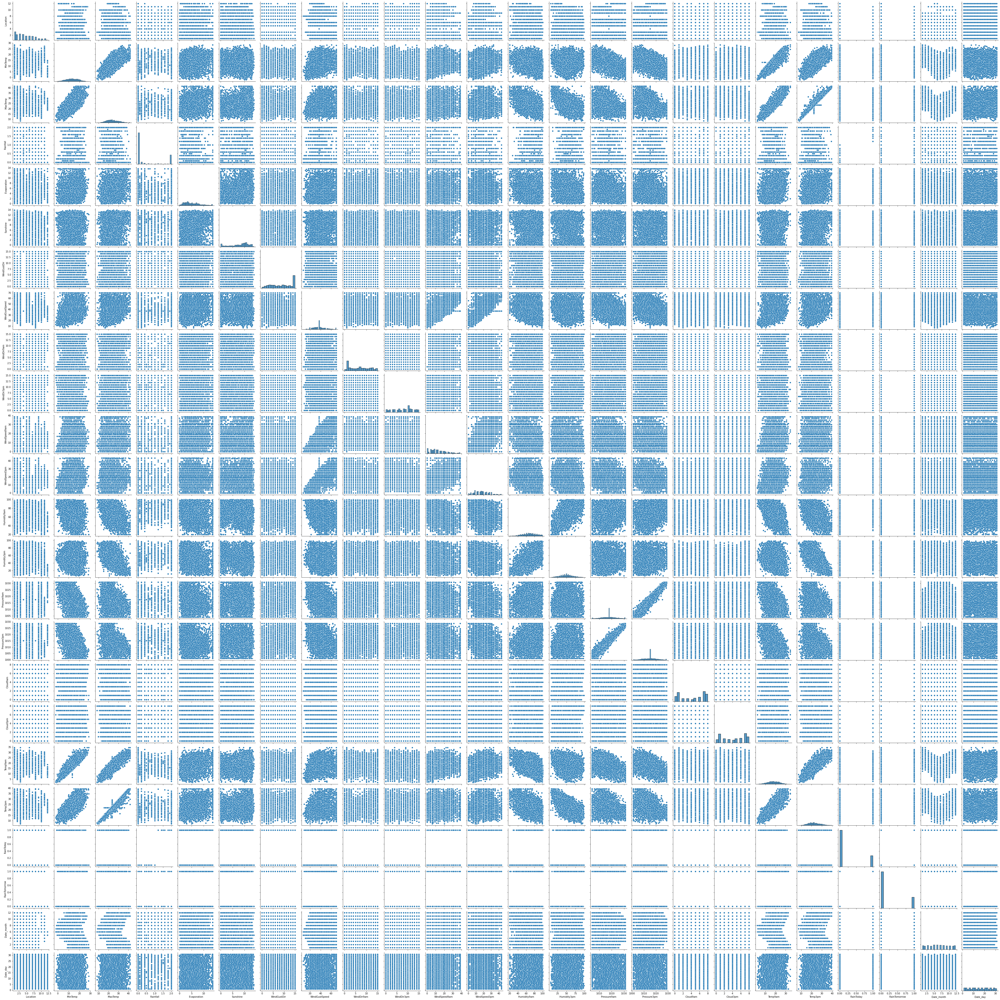

In [65]:
sns.pairplot(df)

#### Checking Correlation with Target Column

In [66]:
#correlation with target column
correlation_with_quality = df.corr()['RainTomorrow'].abs().sort_values(ascending=False)
print(correlation_with_quality)

RainTomorrow     1.000000
Humidity3pm      0.466880
Rainfall         0.342188
RainToday        0.323691
Cloud3pm         0.301822
Humidity9am      0.288102
Sunshine         0.250066
Cloud9am         0.249621
Temp3pm          0.203112
WindGustSpeed    0.182157
MaxTemp          0.160080
Pressure9am      0.155739
Pressure3pm      0.128146
MinTemp          0.097173
WindDir9am       0.092090
WindGustDir      0.078294
Evaporation      0.075086
WindSpeed9am     0.058349
WindDir3pm       0.051787
WindSpeed3pm     0.043490
Temp9am          0.025672
Date_day         0.007560
Location         0.006541
Date_month       0.003575
Name: RainTomorrow, dtype: float64


In [67]:
# dropping irrelevant columns
df.drop(columns=['Date_month','Location','Date_day'],axis=1,inplace=True)

### Checking correlation with other features

In [68]:
#schecking correlation
df_corr = df.corr()
df_corr

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
MinTemp,1.000000,0.728411,0.078959,0.282106,0.017771,0.139791,0.250085,0.214943,0.120503,0.172611,0.191858,-0.153791,0.067847,-0.447754,-0.446115,0.082083,0.043964,0.891475,0.697469,0.075902,0.097173
MaxTemp,0.728411,1.000000,-0.241276,0.361947,0.243480,0.149543,0.171549,0.230427,0.060458,0.057179,0.118595,-0.424545,-0.430275,-0.345848,-0.420746,-0.209251,-0.205666,0.867112,0.974978,-0.225613,-0.160080
Rainfall,0.078959,-0.241276,1.000000,-0.127940,-0.185309,-0.045857,0.086043,-0.065949,-0.009110,0.030763,0.012802,0.419246,0.404028,-0.111738,-0.037388,0.275602,0.243716,-0.098632,-0.252221,0.973921,0.342188
Evaporation,0.282106,0.361947,-0.127940,1.000000,0.205441,0.108249,0.166089,0.163486,0.082082,0.143905,0.095767,-0.266303,-0.200956,-0.199996,-0.215012,-0.069150,-0.102578,0.332347,0.354774,-0.122265,-0.075086
Sunshine,0.017771,0.243480,-0.185309,0.205441,1.000000,0.098317,0.004176,0.112170,0.061686,0.001707,0.036911,-0.273641,-0.319728,-0.001940,-0.042910,-0.334296,-0.331612,0.159870,0.258553,-0.171149,-0.250066
WindGustDir,0.139791,0.149543,-0.045857,0.108249,0.098317,1.000000,-0.118887,0.198576,0.498196,-0.132142,-0.185593,-0.019887,0.002958,0.132551,0.114618,-0.102868,-0.094532,0.156545,0.164349,-0.042973,-0.078294
WindGustSpeed,0.250085,0.171549,0.086043,0.166089,0.004176,-0.118887,1.000000,0.020609,-0.156397,0.607865,0.638562,-0.280945,-0.103479,-0.387862,-0.355432,0.021614,0.048265,0.229453,0.136502,0.085630,0.182157
WindDir9am,0.214943,0.230427,-0.065949,0.163486,0.112170,0.198576,0.020609,1.000000,0.265785,0.180543,0.032082,-0.240586,-0.166946,0.021094,0.002216,-0.065501,-0.088317,0.238148,0.242517,-0.051276,-0.092090
WindDir3pm,0.120503,0.060458,-0.009110,0.082082,0.061686,0.498196,-0.156397,0.265785,1.000000,-0.056286,-0.169100,-0.012784,0.087645,0.180143,0.186363,-0.017843,-0.048909,0.122381,0.068614,-0.004178,-0.051787
WindSpeed9am,0.172611,0.057179,0.030763,0.143905,0.001707,-0.132142,0.607865,0.180543,-0.056286,1.000000,0.555425,-0.376802,-0.120587,-0.175823,-0.143543,-0.015511,0.018291,0.154589,0.042597,0.038356,0.058349


#### We are writing this function to see those columns which are highly correlated with each other

In [69]:
correlation_threshold = 0.85
mask = df_corr.abs() >= correlation_threshold
features_to_drop = set()
for i in range(len(df_corr.columns)):
    for j in range(i+1, len(df_corr.columns)):
        if mask.iloc[i, j]:
            colname_i = df_corr.columns[i]
            colname_j = df_corr.columns[j]
            if colname_i not in features_to_drop:
                features_to_drop.add(colname_j)

In [70]:
features_to_drop

{'Pressure3pm', 'RainToday', 'Temp3pm', 'Temp9am'}

In [71]:
# dropping irrelevant columns
df.drop(columns=['Pressure3pm', 'RainToday', 'Temp3pm', 'Temp9am'],axis=1,inplace=True)

### VIF

In [72]:
num = df.copy()

In [73]:
num.drop('RainTomorrow',axis=1, inplace=True)

In [74]:
sc=StandardScaler()
standard=sc.fit_transform(num)

In [75]:
standard=pd.DataFrame(standard, columns=num.columns)

In [76]:
VIF= pd.DataFrame()
VIF['features']= standard.columns
VIF['vif']=[variance_inflation_factor(standard.values,i) for i in range(len(standard.columns))]

In [77]:
VIF

,features,vif
0,MinTemp,4.509632
1,MaxTemp,5.124688
2,Rainfall,1.433204
3,Evaporation,1.230472
4,Sunshine,1.275410
5,WindGustDir,1.434472
6,WindGustSpeed,2.302863
7,WindDir9am,1.239269
8,WindDir3pm,1.482462
9,WindSpeed9am,2.088758


All the VIF values are less than 10 so we can say that there is no multicollinearty

# 1.PREDICTING 'RainTomorrow'

### Splitting into Feature and Target column

In [78]:
X= df.drop('RainTomorrow', axis=1)
Y=df['RainTomorrow']

### removing Skewness

In [79]:
X.skew()

MinTemp         -0.084215
MaxTemp          0.316009
Rainfall         1.212775
Evaporation      0.766337
Sunshine        -0.633391
WindGustDir     -0.135538
WindGustSpeed    0.525931
WindDir9am       0.255066
WindDir3pm      -0.208233
WindSpeed9am     0.720122
WindSpeed3pm     0.392032
Humidity9am     -0.239061
Humidity3pm      0.151933
Pressure9am      0.027012
Cloud9am        -0.183189
Cloud3pm        -0.129094
dtype: float64

In [80]:
skewed_columns = ['Rainfall','Evaporation','WindSpeed9am']

In [81]:
transformed=power_transform(X[skewed_columns].values)

In [82]:
pd.DataFrame(transformed).skew()

0    0.880783
1   -0.025639
2   -0.123049
dtype: float64

### Standardization

In [83]:
sc=StandardScaler()

In [84]:
X=sc.fit_transform(transformed)

### Data Balancing

In [85]:
sm=SMOTE()

In [86]:
x,y=sm.fit_resample(X,Y)

In [87]:
x.shape , y.shape

((10380, 3), (10380,))

## Model Training

### Find best Randomstate

In [88]:
maxaccu=0
maxRS=0

for i in range(0,200):
    x_train,x_test,y_train,y_test= train_test_split(x,y,random_state=i,test_size=.20)
    LR= LogisticRegression()
    LR.fit(x_train,y_train)
    pred= LR.predict(x_test)
    acc=accuracy_score(y_test,pred)
    if acc>maxaccu:
        maxaccu=acc
        maxRS=i
print("Best accuracy is ",maxaccu,"on Random State =",maxRS)

Best accuracy is  0.708092485549133 on Random State = 198


In [89]:
x_train,x_test,y_train,y_test= train_test_split(x,y,test_size=.20,random_state=maxRS)

### Defining All Classification Models

In [90]:
LR_model= LogisticRegression()
RD_model= RidgeClassifier()
DT_model= DecisionTreeClassifier()
SV_model= SVC()
KNR_model= KNeighborsClassifier()
RFR_model= RandomForestClassifier()
SGD_model= SGDClassifier()
ADA_model=AdaBoostClassifier()
GB_model= GradientBoostingClassifier()

model=[LR_model,RD_model,DT_model,SV_model,KNR_model,RFR_model,SGD_model,ADA_model,GB_model ]

In [91]:
for m in model:
    m.fit(x_train,y_train)
    m.score(x_train,y_train)
    pred= m.predict(x_test)
    print('Accuracy_Score of ',m, 'is', accuracy_score(y_test,pred)*100)
    print('Confusion Matrix of ',m,' is \n', confusion_matrix(y_test,pred) )
    print(classification_report(y_test,pred))
    print('*'*30)

Accuracy_Score of  LogisticRegression() is 70.8092485549133
Confusion Matrix of  LogisticRegression()  is 
 [[858 236]
 [370 612]]
              precision    recall  f1-score   support

           0       0.70      0.78      0.74      1094
           1       0.72      0.62      0.67       982

    accuracy                           0.71      2076
   macro avg       0.71      0.70      0.70      2076
weighted avg       0.71      0.71      0.71      2076

******************************
Accuracy_Score of  RidgeClassifier() is 70.56840077071291
Confusion Matrix of  RidgeClassifier()  is 
 [[858 236]
 [375 607]]
              precision    recall  f1-score   support

           0       0.70      0.78      0.74      1094
           1       0.72      0.62      0.67       982

    accuracy                           0.71      2076
   macro avg       0.71      0.70      0.70      2076
weighted avg       0.71      0.71      0.70      2076

******************************
Accuracy_Score of  Decision

### CrossValidation

In [92]:
for i in model:
    print('Accuracy_Score of ',i, 'is', accuracy_score(y_test,i.predict(x_test))*100)
    print("cross Validation accuracy score of ",i ," is ",cross_val_score(i,x,y,cv=5, scoring='accuracy').mean()*100)
    print('*'*50)

Accuracy_Score of  LogisticRegression() is 70.8092485549133
cross Validation accuracy score of  LogisticRegression()  is  66.96531791907515
**************************************************
Accuracy_Score of  RidgeClassifier() is 70.56840077071291
cross Validation accuracy score of  RidgeClassifier()  is  67.03275529865125
**************************************************
Accuracy_Score of  DecisionTreeClassifier() is 77.55298651252409
cross Validation accuracy score of  DecisionTreeClassifier()  is  74.16184971098266
**************************************************
Accuracy_Score of  SVC() is 71.19460500963392
cross Validation accuracy score of  SVC()  is  66.82080924855491
**************************************************
Accuracy_Score of  KNeighborsClassifier() is 72.20616570327553
cross Validation accuracy score of  KNeighborsClassifier()  is  69.25818882466281
**************************************************
Accuracy_Score of  RandomForestClassifier() is 77.504816955684
cr

##### RandomForestClassifier gave best accuracy score and minimum difference for generalise model

#### Hyperparameter tuning on RandomForestClassifier

In [93]:
n_estimators = [200, 600, 1000]
max_features = ['auto', 'sqrt']
max_depth = [10, 118, 282]
min_samples_split = [2, 3]
min_samples_leaf = [1, 4, 7]
criterion= ['gini', 'entropy']
bootstrap= [True, False]





param_grid = {
    'n_estimators': n_estimators,
    'max_features': max_features,
    'max_depth': max_depth,
    'min_samples_split': min_samples_split,
    'min_samples_leaf': min_samples_leaf,
    'criterion': criterion,
    'bootstrap':bootstrap,
    
    
}
param_grid

{'n_estimators': [200, 600, 1000],
 'max_features': ['auto', 'sqrt'],
 'max_depth': [10, 118, 282],
 'min_samples_split': [2, 3],
 'min_samples_leaf': [1, 4, 7],
 'criterion': ['gini', 'entropy'],
 'bootstrap': [True, False]}

In [94]:
grid_search=GridSearchCV(estimator=RFR_model,param_grid=param_grid,cv=3,n_jobs=-1,verbose=2)
grid_search.fit(x_train,y_train)

Fitting 3 folds for each of 432 candidates, totalling 1296 fits


GridSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'bootstrap': [True, False],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [10, 118, 282],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 4, 7],
                         'min_samples_split': [2, 3],
                         'n_estimators': [200, 600, 1000]},
             verbose=2)

In [95]:
grid_search.best_estimator_

RandomForestClassifier(bootstrap=False, max_depth=118, max_features='sqrt',
                       min_samples_split=3, n_estimators=1000)

In [96]:
grid_search.best_params_

{'bootstrap': False,
 'criterion': 'gini',
 'max_depth': 118,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 3,
 'n_estimators': 1000}

In [97]:
GCV_pred=grid_search.best_estimator_.predict(x_test)
accuracy_score(y_test,GCV_pred)

0.7880539499036608

### RUC AOC Curve/Plot

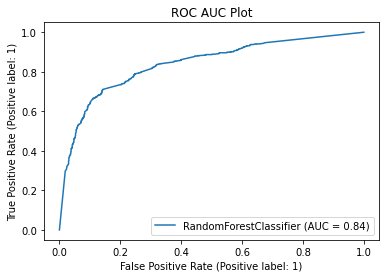

In [98]:
plot_roc_curve(grid_search.best_estimator_,x_test,y_test)
plt.title('ROC AUC Plot')
plt.show()

### Confusion matrix

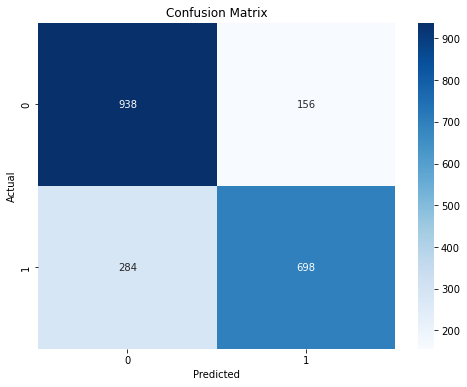

In [99]:
# Plot confusion matrix
plt.figure(figsize=(8, 6))
y_pred = grid_search.best_estimator_.predict(x_test)
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

### Save Model

In [100]:
# Save the best estimator (trained RandomForestClassifier model)
with open("Rainfall_weather_RainTomorrow.pkl", "wb") as file:
    pickle.dump(grid_search.best_estimator_, file)

# 2.PREDICTING Rainfall

In [101]:
new_df=pd.read_csv('clean_data.csv')
new_df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Date_month,Date_day
0,3,13.4,22.9,0.6,4.2,3.8,4.0,44.0,5.0,3.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,0,0,12,1
1,3,7.4,25.1,0.0,8.0,9.9,2.0,44.0,0.0,6.0,4.0,22.0,44.0,25.0,1010.6,1007.8,4.0,1.0,17.2,24.3,0,0,12,2
2,3,12.9,25.7,0.0,2.0,5.8,5.0,46.0,5.0,6.0,19.0,26.0,38.0,30.0,1007.6,1008.7,8.0,2.0,21.0,23.2,0,0,12,3
3,3,9.2,28.0,0.0,2.8,10.1,11.0,24.0,13.0,14.0,11.0,9.0,45.0,16.0,1017.6,1012.8,0.0,2.0,18.1,26.5,0,0,12,4
4,3,17.5,32.3,1.0,1.2,9.5,4.0,41.0,12.0,0.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6757,12,2.8,23.4,0.0,7.6,9.9,15.0,31.0,13.0,13.0,13.0,11.0,51.0,24.0,1024.6,1020.3,7.0,4.0,10.1,22.4,0,0,6,21
6758,12,3.6,25.3,0.0,9.4,12.1,0.0,22.0,13.0,2.0,13.0,9.0,56.0,21.0,1023.5,1019.1,1.0,5.0,10.9,24.5,0,0,6,22
6759,12,5.4,26.9,0.0,2.4,6.7,3.0,37.0,13.0,3.0,9.0,9.0,53.0,24.0,1021.0,1016.8,8.0,6.0,12.5,26.1,0,0,6,23
6760,12,7.8,27.0,0.0,4.0,0.0,12.0,28.0,11.0,2.0,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,0,0,6,24


### Checking Correlation with Target Column

In [102]:
#correlation with target column
correlation_with_quality = new_df.corr()['Rainfall'].abs().sort_values(ascending=False)
print(correlation_with_quality)

Rainfall         1.000000
RainToday        0.973921
Humidity9am      0.419246
Humidity3pm      0.404028
RainTomorrow     0.342188
Cloud9am         0.275602
Temp3pm          0.252221
Cloud3pm         0.243716
MaxTemp          0.241276
Sunshine         0.185309
Evaporation      0.127940
Pressure9am      0.111738
Temp9am          0.098632
WindGustSpeed    0.086043
MinTemp          0.078959
WindDir9am       0.065949
WindGustDir      0.045857
Pressure3pm      0.037388
WindSpeed9am     0.030763
WindSpeed3pm     0.012802
Date_month       0.010149
WindDir3pm       0.009110
Location         0.007119
Date_day         0.005818
Name: Rainfall, dtype: float64


<AxesSubplot:>

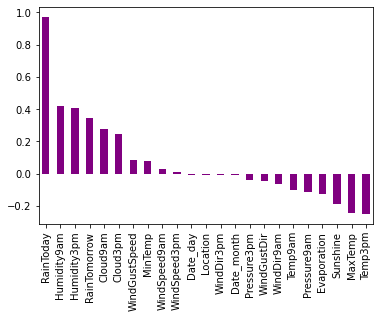

In [103]:
new_df.corr()['Rainfall'].drop(['Rainfall']).sort_values(ascending=False).plot(kind='bar', color='purple')

In [104]:
# dropping irrelevant columns
new_df.drop(columns = ['Date_day','Location','WindDir3pm'],axis=1,inplace=True)

### Splitting into Feature and Target column

In [105]:
x= new_df.drop('Rainfall', axis=1)
y=new_df['Rainfall']

### Standardization

In [106]:
sc=StandardScaler()

In [107]:
x=sc.fit_transform(x)

## Model Training

### Find best Randomstate

In [108]:
maxaccu=0
maxRS=0

for i in range(0,100):
    X_train,X_test,Y_train,Y_test= train_test_split(x,y,random_state=i,test_size=.33)
    LR= LinearRegression()
    LR.fit(X_train,Y_train)
    pred= LR.predict(X_test)
    acc=r2_score(Y_test,pred)
    if acc>maxaccu:
        maxaccu=acc
        maxRS=i
print("Best accuracy is ",maxaccu,"on Random State =",maxRS)

Best accuracy is  0.9586473204997636 on Random State = 63


In [109]:
X_train,X_test,Y_train,Y_test= train_test_split(x,y,test_size=.33,random_state=maxRS)

### Defining All Regression Models

In [110]:
# Create instances of regression models
LR_model = LinearRegression()
RFR_model = RandomForestRegressor()
GB_model = GradientBoostingRegressor()
ADA_model = AdaBoostRegressor()
Bag_model = BaggingRegressor()
DT_model = DecisionTreeRegressor()
KNR_model = KNeighborsRegressor()

# Create a list of regression models
model = [LR_model, RFR_model, GB_model, ADA_model, Bag_model, DT_model, KNR_model]

#### Model training

In [111]:
for reg_model in model:
    reg_model.fit(X_train, Y_train)
    train_pred = reg_model.predict(X_train)
    test_pred = reg_model.predict(X_test)
    
    # R-squared (Coefficient of Determination)
    r2_train = r2_score(Y_train, train_pred)
    r2_test = r2_score(Y_test, test_pred)
    
    # Mean Squared Error (MSE)
    mse_train = mean_squared_error(Y_train, train_pred)
    mse_test = mean_squared_error(Y_test, test_pred)
    
    # Mean Absolute Error (MAE)
    mae_train = mean_absolute_error(Y_train, train_pred)
    mae_test = mean_absolute_error(Y_test, test_pred)
    
    print('Model:', reg_model)
    print('R-squared (Train):', r2_train)
    print('R-squared (Test):', r2_test)
    print('Mean Squared Error (MSE) - Train:', mse_train)
    print('Mean Squared Error (MSE) - Test:', mse_test)
    print('Mean Absolute Error (MAE) - Train:', mae_train)
    print('Mean Absolute Error (MAE) - Test:', mae_test)
    print('*' * 30)

Model: LinearRegression()
R-squared (Train): 0.9484821062738158
R-squared (Test): 0.9586473204997636
Mean Squared Error (MSE) - Train: 0.032880116698291294
Mean Squared Error (MSE) - Test: 0.028212784374883303
Mean Absolute Error (MAE) - Train: 0.1070861122843213
Mean Absolute Error (MAE) - Test: 0.0987961043869585
******************************
Model: RandomForestRegressor()
R-squared (Train): 0.9923511049394697
R-squared (Test): 0.955036217856986
Mean Squared Error (MSE) - Train: 0.004881732229580581
Mean Squared Error (MSE) - Test: 0.030676452060931902
Mean Absolute Error (MAE) - Train: 0.04053708609271526
Mean Absolute Error (MAE) - Test: 0.10347535842293906
******************************
Model: GradientBoostingRegressor()
R-squared (Train): 0.958829793428667
R-squared (Test): 0.9580833786649887
Mean Squared Error (MSE) - Train: 0.02627594217560514
Mean Squared Error (MSE) - Test: 0.02859753258411095
Mean Absolute Error (MAE) - Train: 0.09320578868618237
Mean Absolute Error (MAE) -

### CrossValidation

In [112]:
for reg_model in model:
    reg_model.fit(X_train, Y_train)
    r2_test = r2_score(Y_test, reg_model.predict(X_test))
    
    cv_r2 = cross_val_score(reg_model, x, y, cv=5, scoring='r2').mean()
    
    print('Model:', reg_model)
    print('R-squared (Test):', r2_test)
    print(f'Cross-validation R-squared:', cv_r2)
    print('*' * 50)

Model: LinearRegression()
R-squared (Test): 0.9586473204997636
Cross-validation R-squared: 0.9512791431481474
**************************************************
Model: RandomForestRegressor()
R-squared (Test): 0.9559028099225064
Cross-validation R-squared: 0.9472100830806122
**************************************************
Model: GradientBoostingRegressor()
R-squared (Test): 0.9581071061775084
Cross-validation R-squared: 0.9500097430895618
**************************************************
Model: AdaBoostRegressor()
R-squared (Test): 0.9398566501507016
Cross-validation R-squared: 0.9383294374075021
**************************************************
Model: BaggingRegressor()
R-squared (Test): 0.951564234198469
Cross-validation R-squared: 0.9412705081058537
**************************************************
Model: DecisionTreeRegressor()
R-squared (Test): 0.8970631047483016
Cross-validation R-squared: 0.8889761592309261
**************************************************
Model: KNeighbo

#### Linear Regression is beast model

#### Hyperparameter tuning on Linear regression

In [113]:
param_grid = {
    'fit_intercept': [True, False],
    'normalize': [True, False],
    'copy_X': [True, False]
}


param_grid

{'fit_intercept': [True, False],
 'normalize': [True, False],
 'copy_X': [True, False]}

In [114]:
grid_search=GridSearchCV(estimator=LR_model,param_grid=param_grid,cv=3,n_jobs=-1,verbose=2)
grid_search.fit(X_train,Y_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits


GridSearchCV(cv=3, estimator=LinearRegression(), n_jobs=-1,
             param_grid={'copy_X': [True, False],
                         'fit_intercept': [True, False],
                         'normalize': [True, False]},
             verbose=2)

In [115]:
grid_search.best_estimator_

LinearRegression(normalize=True)

In [116]:
grid_search.best_params_

{'copy_X': True, 'fit_intercept': True, 'normalize': True}

In [117]:
GCV_pred=grid_search.best_estimator_.predict(X_test)
r2_score(Y_test,GCV_pred)

0.9586473204997636

### Saving the Model

In [118]:
file_path = 'Rainfall.pkl'
with open(file_path, 'wb') as file:
    # Use the pickle.dump() method to save the object to the file
    pickle.dump(grid_search.best_estimator_, file)

**Submitted By: Amit Kumar**